In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.animation as animation
plt.rcParams['axes.facecolor']='gray'
import seaborn as sns

from IPython.display import HTML

In [2]:
%matplotlib inline

In [3]:
#pip install pandas-profiling

In [4]:
from pandas_profiling import ProfileReport

In [5]:
import pandas as pd
df_2019 = pd.read_excel("Datathon_EPA_Air_Quality_Demographics_Meteorology_2019.xlsx")
df_2020 = pd.read_excel("Datathon_EPA_Air_Quality_Demographics_Meteorology_2020.xlsx")
#merging EAP 2019 data and the 2020 one
#df_eap= df_2019.merge(df_2020, on='AQS_ID', how='outer')
df_chealth = pd.read_excel("dataset_countryhealth.xlsx")

In [6]:
datetime_is_numeric=True
df_2019.describe(include='all')

C:\Users\satou\AppData\Local\Temp\ipykernel_22480\4097220751.py:2: FutureWarning: Treating datetime data as categorical rather than numeric in `.describe` is deprecated and will be removed in a future version of pandas. Specify `datetime_is_numeric=True` to silence this warning and adopt the future behavior now.
  df_2019.describe(include='all')


,AQS_ID,LATITUDE,LONGITUDE,COUNTY,STATE,CBSA,PEOPLE_OF_COLOR_FRACTION,LOW_INCOME_FRACTION,LINGUISTICALLY_ISOLATED_FRACTION,LESS_THAN_HS_ED_FRACTION,...,RELATIVE_HUMIDITY,WIND_SPEED_METERS_PER_SECOND,WIND_DIRECTION,PM25_UG_PER_CUBIC_METER,OZONE_PPM,NO2_PPB,CO_PPM,SO2_PPB,LEAD_UG_PER_CUBIC_METER,BENZENE_PPBC
count,129470,129470.000000,129470.000000,129470,129470,117210,129393.000000,129393.000000,129393.000000,129393.000000,...,50670.000000,58576.000000,59484.000000,129470.000000,129470.000000,61395.000000,39749.000000,47337.000000,659.000000,3307.000000
unique,512,NaN,NaN,351,52,254,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,55-079-0026,NaN,NaN,Maricopa,California,"San Francisco-Oakland-Hayward, CA",NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,364,NaN,NaN,2525,24067,3119,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
first,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
last,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,NaN,38.533022,-96.298816,NaN,NaN,NaN,0.383927,0.375089,0.049076,0.147154,...,63.095606,2.250522,189.811975,6.962038,0.039954,7.211805,0.239979,0.504458,0.004382,0.996383
std,NaN,4.837426,17.693938,NaN,NaN,NaN,0.303357,0.215389,0.091215,0.129474,...,18.520436,5.239192,62.589750,4.498417,0.011785,6.351797,0.158697,0.780967,0.004571,0.896393
min,NaN,18.420089,-158.088613,NaN,NaN,NaN,0.000000,0.000000,0.000000,0.000000,...,1.083333,0.000000,6.375000,-4.300000,0.000000,-3.565217,-0.395652,-1.412500,0.000000,0.000000
25%,NaN,35.320105,-112.095767,NaN,NaN,NaN,0.110000,0.210000,0.000000,0.060000,...,51.375000,1.223949,147.372917,4.000000,0.032000,2.650000,0.147826,0.079167,0.002000,0.515000


In [7]:
'''prof = ProfileReport(df)
prof.to_file(output_file='output.html')'''

"prof = ProfileReport(df)\nprof.to_file(output_file='output.html')"

In [8]:
#df_2019.info()
for i in df_2019.columns:
    print('column name:{}    unique values:{}'.format(i,len(df_2019[i].unique())))

column name:AQS_ID    unique values:512
column name:LATITUDE    unique values:512
column name:LONGITUDE    unique values:512
column name:COUNTY    unique values:351
column name:STATE    unique values:52
column name:CBSA    unique values:255
column name:PEOPLE_OF_COLOR_FRACTION    unique values:100
column name:LOW_INCOME_FRACTION    unique values:90
column name:LINGUISTICALLY_ISOLATED_FRACTION    unique values:39
column name:LESS_THAN_HS_ED_FRACTION    unique values:60
column name:DATE    unique values:364
column name:TEMPERATURE_CELSIUS    unique values:9835
column name:RELATIVE_HUMIDITY    unique values:7562
column name:WIND_SPEED_METERS_PER_SECOND    unique values:4885
column name:WIND_DIRECTION    unique values:17999
column name:PM25_UG_PER_CUBIC_METER    unique values:502
column name:OZONE_PPM    unique values:100
column name:NO2_PPB    unique values:15223
column name:CO_PPM    unique values:14126
column name:SO2_PPB    unique values:3224
column name:LEAD_UG_PER_CUBIC_METER    uniq

WE ARE FILLING MISSING VALUES IN 2 DIFFERENT CATEGORIES

FOR NUMERIC VALUES : MEAN()

FOR CATEGORICAL VALUES : MODE()
    
'''df_2019['Xylene']=df_2019['Xylene'].fillna(df_2019['Xylene'].mean())
df_2019['AQI']=df_2019['AQI'].fillna(df_2019['AQI'].mode()[0])'''

In [9]:
print(f"The available data is between {df_2019['DATE'].min()} and {df_2019['DATE'].max()}")

The available data is between 2019-01-01 00:00:00 and 2019-12-30 00:00:00


In [10]:
#df_2019.isnull().sum()
#creating a func to make missing value table so that it can be used again
def missing_value_table(df):
    values = df.isnull().sum()
    percentage = 100*df.isnull().sum()/len(df)
    table = pd.concat([values,percentage.round(2)],axis=1)
    table.columns = ['No of missing values','% of missing values']
    return table[table['No of missing values']!=0].sort_values('% of missing values',ascending=False).style.background_gradient('Greens')
    
missing_value_table(df_2019)

,No of missing values,% of missing values
LEAD_UG_PER_CUBIC_METER,128811,99.490000
BENZENE_PPBC,126163,97.450000
CO_PPM,89721,69.300000
SO2_PPB,82133,63.440000
RELATIVE_HUMIDITY,78800,60.860000
WIND_SPEED_METERS_PER_SECOND,70894,54.760000
WIND_DIRECTION,69986,54.060000
NO2_PPB,68075,52.580000
TEMPERATURE_CELSIUS,56767,43.850000
CBSA,12260,9.470000


<AxesSubplot:>

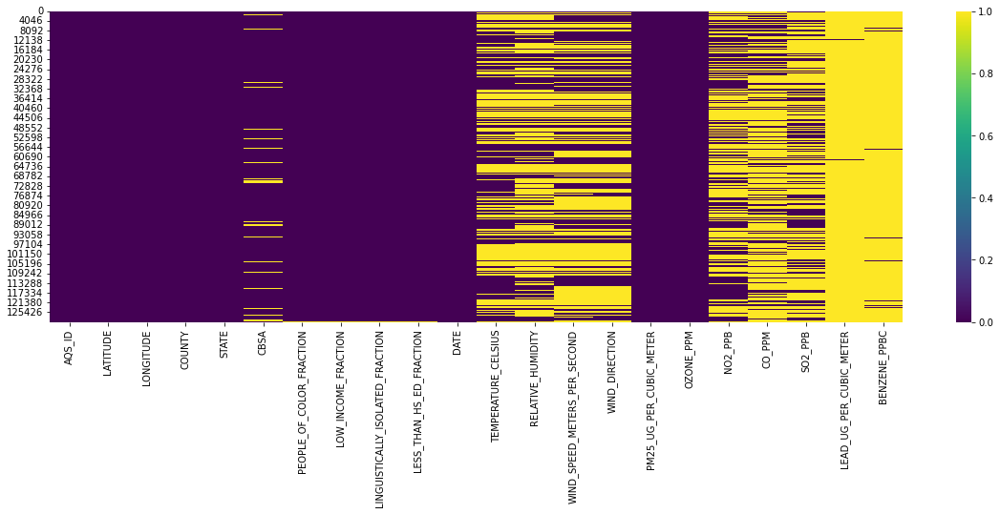

In [11]:
import seaborn as sns
plt.figure(figsize=(20,6))
sns.heatmap(df_2019.isna(), cmap='viridis')

In [12]:
index_Bdays = pd.date_range(start="1/1/2019", end="12/30/2019", freq="B")
index_Bdays

DatetimeIndex(['2019-01-01', '2019-01-02', '2019-01-03', '2019-01-04',
               '2019-01-07', '2019-01-08', '2019-01-09', '2019-01-10',
               '2019-01-11', '2019-01-14',
               ...
               '2019-12-17', '2019-12-18', '2019-12-19', '2019-12-20',
               '2019-12-23', '2019-12-24', '2019-12-25', '2019-12-26',
               '2019-12-27', '2019-12-30'],
              dtype='datetime64[ns]', length=260, freq='B')

In [13]:
index_weekends = pd.date_range(start="1/1/2019", end="12/30/2019", freq="W")
index_weekends

DatetimeIndex(['2019-01-06', '2019-01-13', '2019-01-20', '2019-01-27',
               '2019-02-03', '2019-02-10', '2019-02-17', '2019-02-24',
               '2019-03-03', '2019-03-10', '2019-03-17', '2019-03-24',
               '2019-03-31', '2019-04-07', '2019-04-14', '2019-04-21',
               '2019-04-28', '2019-05-05', '2019-05-12', '2019-05-19',
               '2019-05-26', '2019-06-02', '2019-06-09', '2019-06-16',
               '2019-06-23', '2019-06-30', '2019-07-07', '2019-07-14',
               '2019-07-21', '2019-07-28', '2019-08-04', '2019-08-11',
               '2019-08-18', '2019-08-25', '2019-09-01', '2019-09-08',
               '2019-09-15', '2019-09-22', '2019-09-29', '2019-10-06',
               '2019-10-13', '2019-10-20', '2019-10-27', '2019-11-03',
               '2019-11-10', '2019-11-17', '2019-11-24', '2019-12-01',
               '2019-12-08', '2019-12-15', '2019-12-22', '2019-12-29'],
              dtype='datetime64[ns]', freq='W-SUN')

In [14]:
df_2019["shifted_1"] = df_2019["PM25_UG_PER_CUBIC_METER"].shift(periods=1)  # the default
df_2019["shifted_2"] = df_2019["PM25_UG_PER_CUBIC_METER"].shift(periods=2)

df_2019[['DATE', "PM25_UG_PER_CUBIC_METER", 'shifted_1', 'shifted_2']].head(6)

,DATE,PM25_UG_PER_CUBIC_METER,shifted_1,shifted_2
0,2019-03-01,3.8,NaN,NaN
1,2019-03-04,6.5,3.8,NaN
2,2019-03-07,8.6,6.5,3.8
3,2019-03-10,7.5,8.6,6.5
4,2019-03-13,8.8,7.5,8.6
5,2019-03-16,7.0,8.8,7.5


In [15]:
df_2019["lagged_1"] = df_2019["PM25_UG_PER_CUBIC_METER"].shift(periods=-1)  # the default
df_2019["lagged_2"] = df_2019["PM25_UG_PER_CUBIC_METER"].shift(periods=-2)

df_2019[['DATE', "PM25_UG_PER_CUBIC_METER", 'lagged_1', 'lagged_2' ]].head(6)

,DATE,PM25_UG_PER_CUBIC_METER,lagged_1,lagged_2
0,2019-03-01,3.8,6.5,8.6
1,2019-03-04,6.5,8.6,7.5
2,2019-03-07,8.6,7.5,8.8
3,2019-03-10,7.5,8.8,7.0
4,2019-03-13,8.8,7.0,7.3
5,2019-03-16,7.0,7.3,7.4


In [16]:
df_2019["diff_lag"]= df_2019["lagged_1"] - df_2019["PM25_UG_PER_CUBIC_METER"]
df_2019_lag= df_2019[['DATE', "PM25_UG_PER_CUBIC_METER", 'lagged_1', 'diff_lag' ]].head(6)
df_2019_lag.asfreq("B")

,DATE,PM25_UG_PER_CUBIC_METER,lagged_1,diff_lag
1970-01-01,NaT,NaN,NaN,NaN


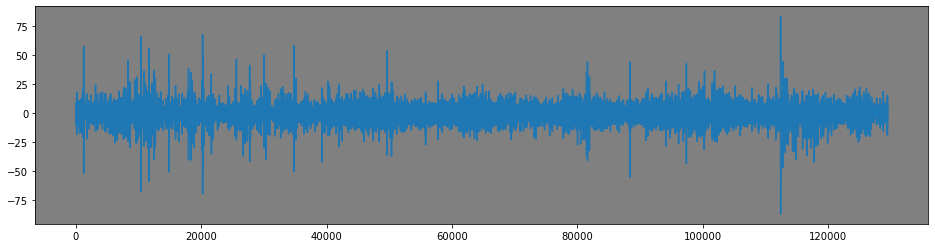

In [17]:
df_2019["diff_lag"].plot(figsize=(16, 4));

We can observe that PM25, OZone and NO2 are the pollutants variable that have less missing data, the more yellow the higher the missing data.

In [18]:
'''plt.figure(figsize=(20,6))
plt.hist(df_2019['PM25_UG_PER_CUBIC_METER'], 5000,density=False, histtype='bar', facecolor='b', color='k', alpha=0.5)
plt.title('Histogram of PM25_UG_PER_CUBIC_METER', fontsize=16)
plt.show()'''

"plt.figure(figsize=(20,6))\nplt.hist(df_2019['PM25_UG_PER_CUBIC_METER'], 5000,density=False, histtype='bar', facecolor='b', color='k', alpha=0.5)\nplt.title('Histogram of PM25_UG_PER_CUBIC_METER', fontsize=16)\nplt.show()"

In [19]:
'''Counties = df_2019['COUNTY'].value_counts()
print(f'Total number of cities in the dataset : {len(Counties)}')
print(Counties.index)'''

"Counties = df_2019['COUNTY'].value_counts()\nprint(f'Total number of cities in the dataset : {len(Counties)}')\nprint(Counties.index)"

In [20]:
#df_2019.dtypes

C:\Users\satou\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='PM25_UG_PER_CUBIC_METER'>

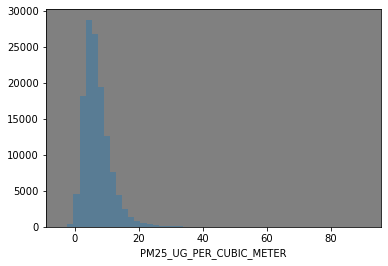

In [21]:

sns.distplot(df_2019['PM25_UG_PER_CUBIC_METER'], kde= False)

<AxesSubplot:xlabel='PM25_UG_PER_CUBIC_METER', ylabel='PEOPLE_OF_COLOR_FRACTION'>

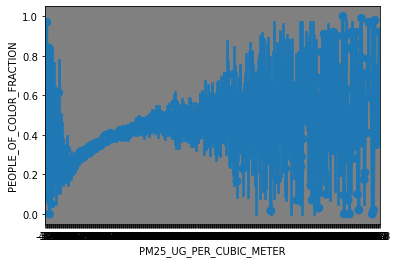

In [22]:
'''sns.jointplot(x='PM25_UG_PER_CUBIC_METER', y='PEOPLE_OF_COLOR_FRACTION', data=df_2019, kind ='reg')'''

sns.pointplot(x='PM25_UG_PER_CUBIC_METER', y='PEOPLE_OF_COLOR_FRACTION', data=df_2019)

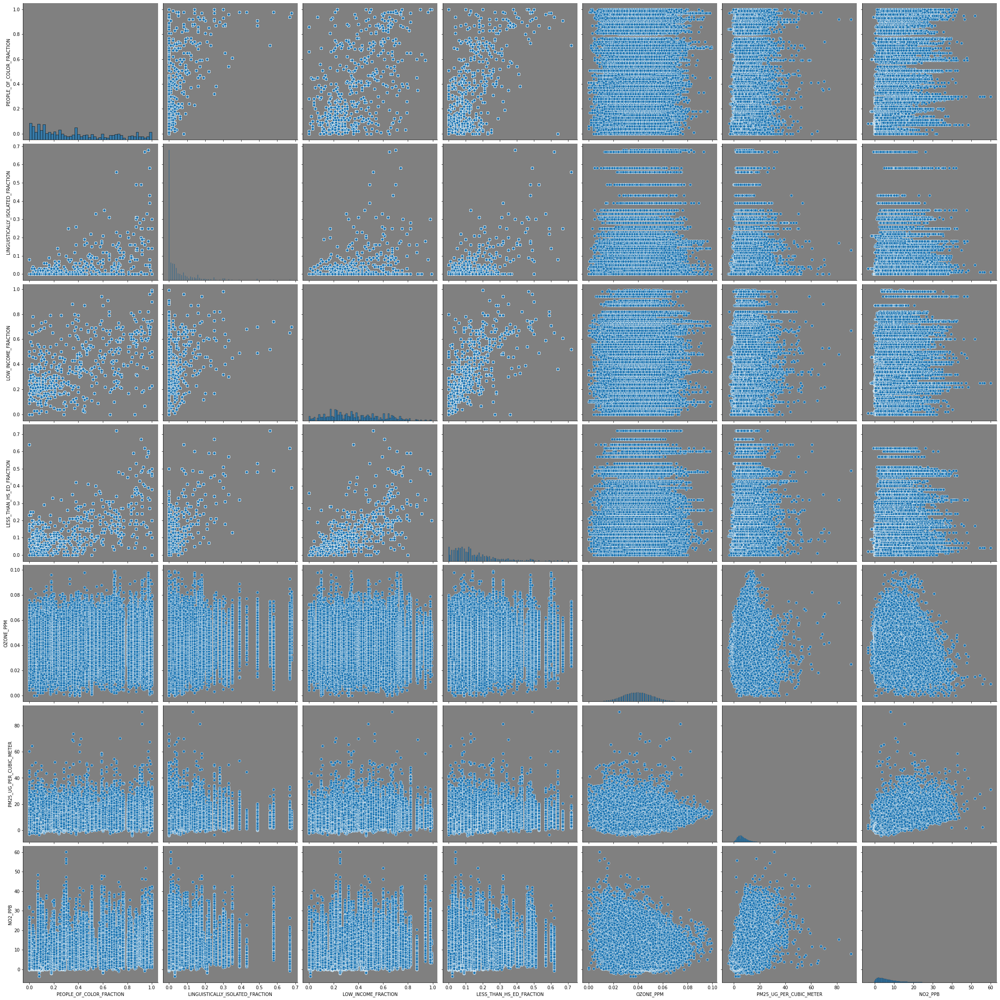

In [23]:
#demographic vaariables vs allpolluttants
column_pairplot_dm=['PEOPLE_OF_COLOR_FRACTION','LINGUISTICALLY_ISOLATED_FRACTION', 'LOW_INCOME_FRACTION', 'LESS_THAN_HS_ED_FRACTION', 'OZONE_PPM','PM25_UG_PER_CUBIC_METER', 'NO2_PPB']
sns.pairplot(df_2019,kind='scatter',vars=column_pairplot_dm,dropna=True,height=4.5,aspect=1)

In [24]:
#sns.clustermap(column_pairplot_dm)

In [25]:
#sns.pairplot(df_2019) #hue='categorical column' color='coolwarm'

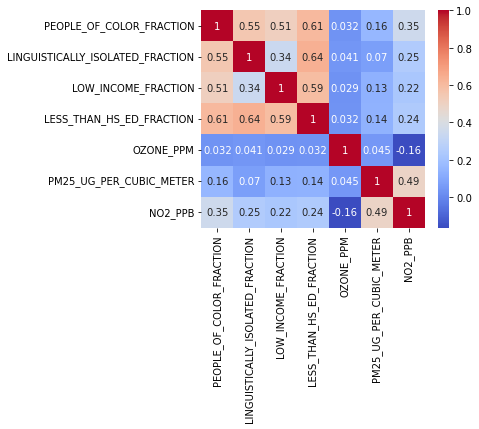

In [26]:
df_2019_cp= df_2019.copy()
df_2019_demographic=df_2019_cp[column_pairplot_dm]
#df_weather=pd.DataFrame(column_pairplot)
plt.figure(figsize=(5,4))
sns.heatmap(df_2019_demographic.corr(),cmap='coolwarm',annot=True);

Seems like PM2 and Nitrogene Dioxide are the ones that are more correlated to the demographic variables. Ozone is relatively low.

In [27]:
df_2019_dm= df_2019.copy()
df_2019_dm['Multiple_pollutans']=df_2019_dm['OZONE_PPM']+df_2019_dm['PM25_UG_PER_CUBIC_METER'] +df_2019_dm['NO2_PPB']
df_2019_dm['Comb_EJ_metrics']=df_2019_dm['PEOPLE_OF_COLOR_FRACTION']+df_2019_dm['LINGUISTICALLY_ISOLATED_FRACTION'] +df_2019_dm['LOW_INCOME_FRACTION'] + df_2019_dm['LESS_THAN_HS_ED_FRACTION'] 
#pollutants=['OZONE_PPM','PM25_UG_PER_CUBIC_METER', 'NO2_PPB']



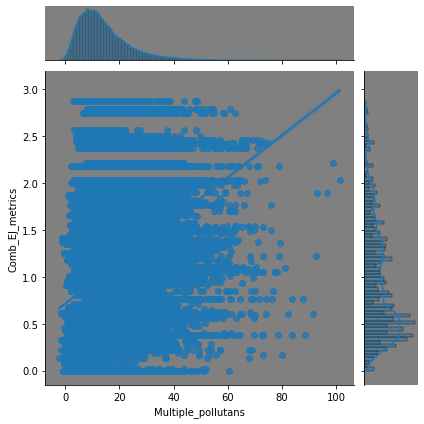

In [28]:
sns.jointplot(x='Multiple_pollutans', y='Comb_EJ_metrics', data=df_2019_dm, kind ='reg')

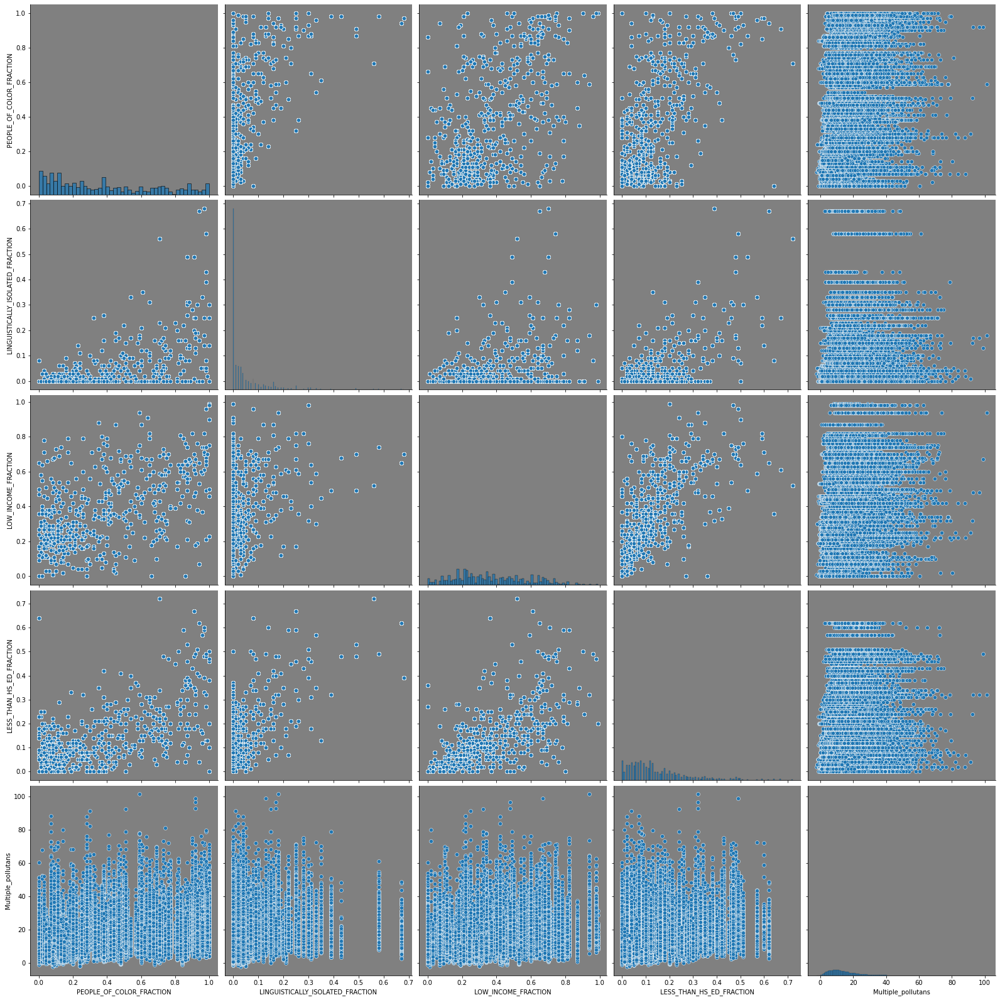

In [29]:
#demographic vaariables vs allpolluttants
cpairplot_dm_allpoluttants=['PEOPLE_OF_COLOR_FRACTION','LINGUISTICALLY_ISOLATED_FRACTION', 'LOW_INCOME_FRACTION', 'LESS_THAN_HS_ED_FRACTION','Multiple_pollutans']
sns.pairplot(df_2019_dm,kind='scatter',vars=cpairplot_dm_allpoluttants,dropna=True,height=4.5,aspect=1)

Corellation between demographic variables(Environmental Justice?) and multiple pollutants(Particulate matter, Ozone & Nitrogene Dioxide)

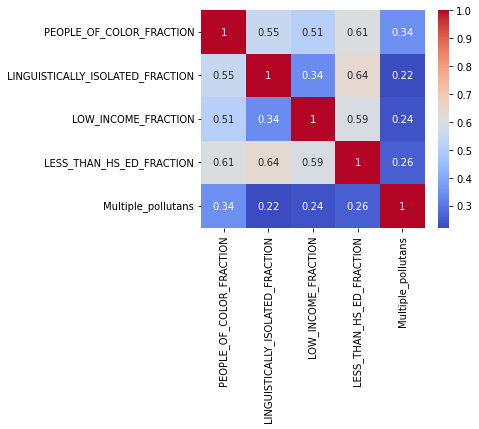

In [30]:
df_dm_mp= df_2019_dm[cpairplot_dm_allpoluttants]
#df_weather=pd.DataFrame(column_pairplot)
plt.figure(figsize=(5,4))
sns.heatmap(df_dm_mp.corr(),cmap='coolwarm',annot=True);

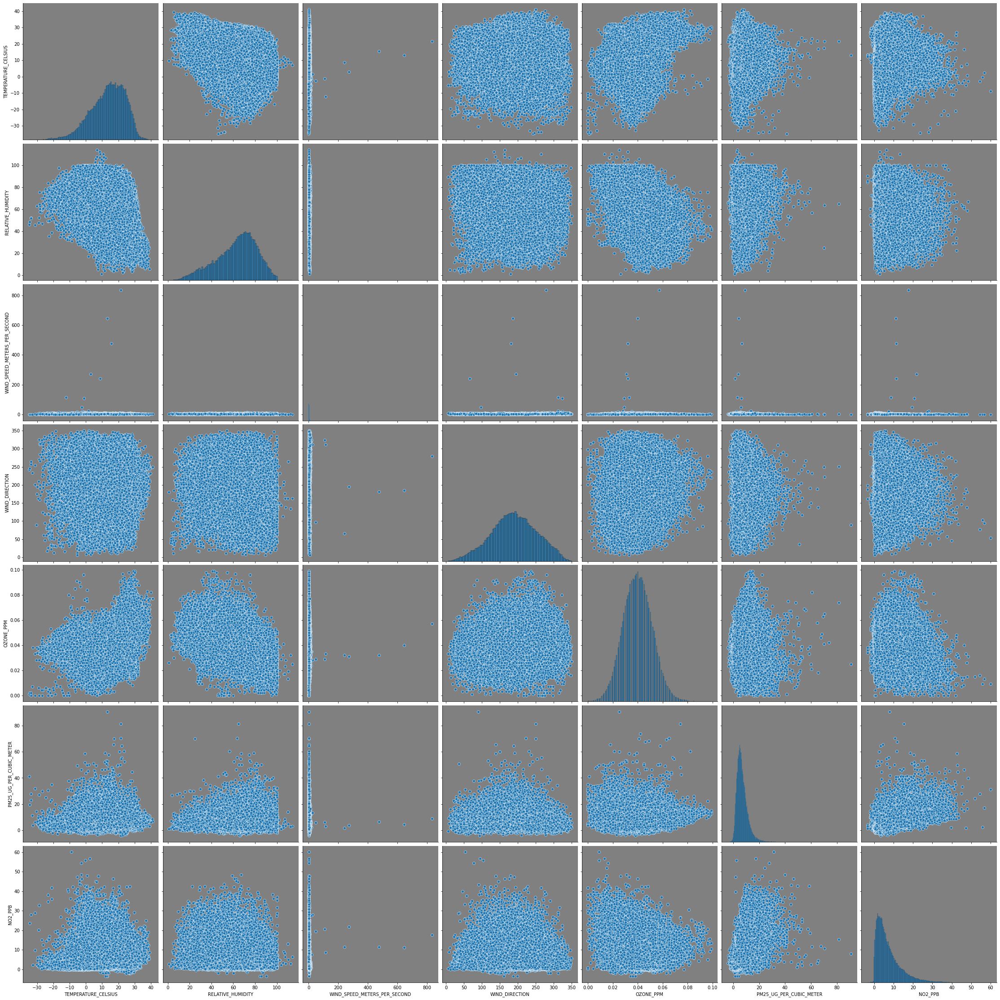

In [31]:
#weather variables vs multiple poluttants
column_pairplot_wt=['TEMPERATURE_CELSIUS','RELATIVE_HUMIDITY', 'WIND_SPEED_METERS_PER_SECOND', 'WIND_DIRECTION','OZONE_PPM','PM25_UG_PER_CUBIC_METER', 'NO2_PPB']
sns.pairplot(df_2019,kind='scatter',vars=column_pairplot_wt,dropna=True,height=4.5,aspect=1)

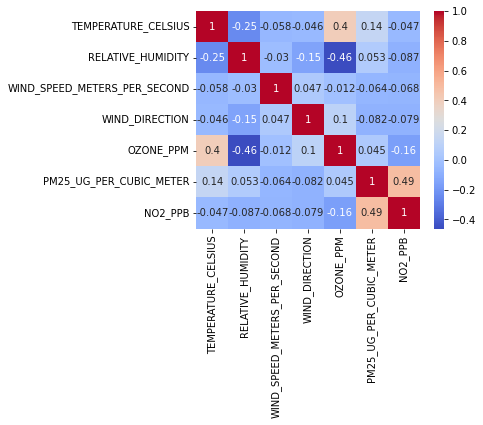

In [32]:
df_2019_wt= df_2019.copy()
df_2019_weather=df_2019_cp[column_pairplot_wt]
#df_weather=pd.DataFrame(column_pairplot)
plt.figure(figsize=(5,4))
sns.heatmap(df_2019_weather.corr(),cmap='coolwarm',annot=True);

We can see that the corrolation btw meteorogique variables and the polluttants are relatively low expect for the relative humidity that has almost 50% of correlation with ozone

In [33]:
df_wt_mp= df_2019.copy()
df_wt_mp['Multiple_pollutans']=df_wt_mp['OZONE_PPM']+df_wt_mp['PM25_UG_PER_CUBIC_METER'] +df_wt_mp['NO2_PPB']
#pollutants=['OZONE_PPM','PM25_UG_PER_CUBIC_METER', 'NO2_PPB']

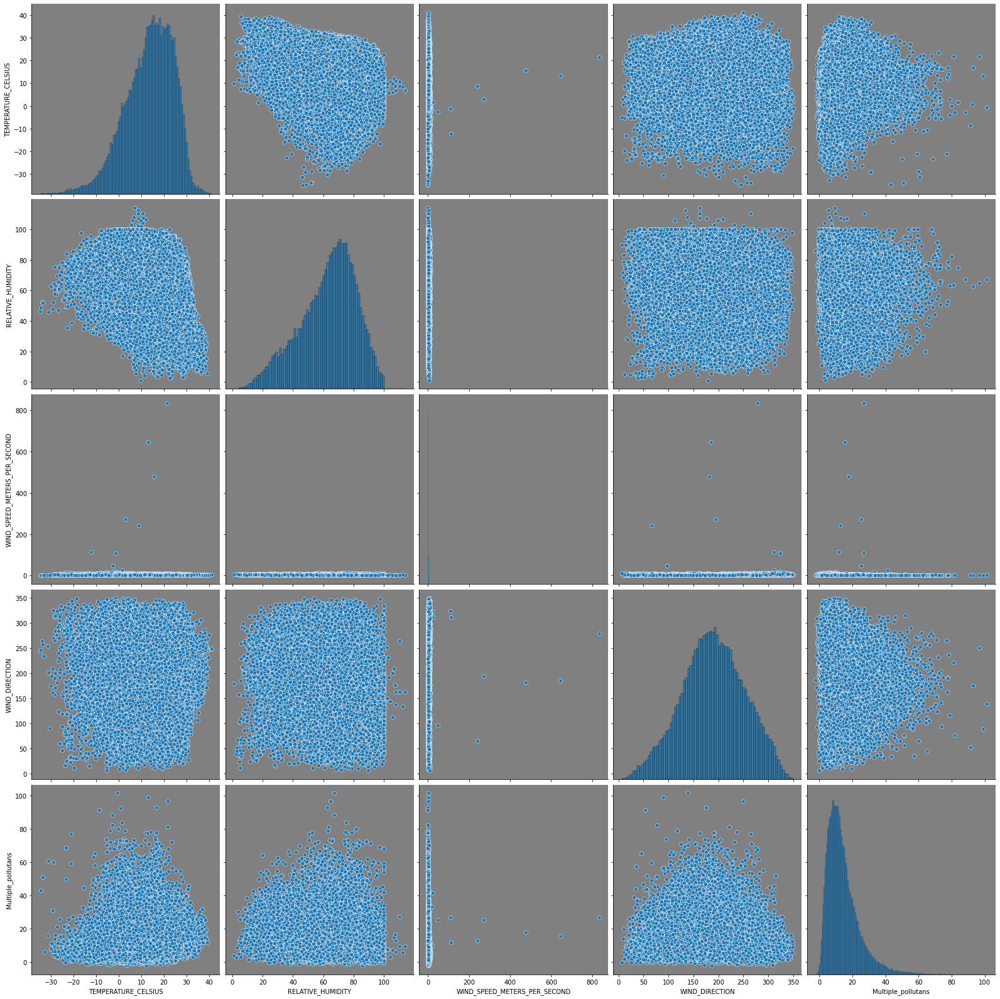

In [34]:
#weather variables vs multiple poluttants
cpairplot_wt_allpolluttant=['TEMPERATURE_CELSIUS','RELATIVE_HUMIDITY', 'WIND_SPEED_METERS_PER_SECOND', 'WIND_DIRECTION','Multiple_pollutans']
sns.pairplot(df_wt_mp,kind='scatter',vars=cpairplot_wt_allpolluttant,dropna=True,height=4.5,aspect=1)

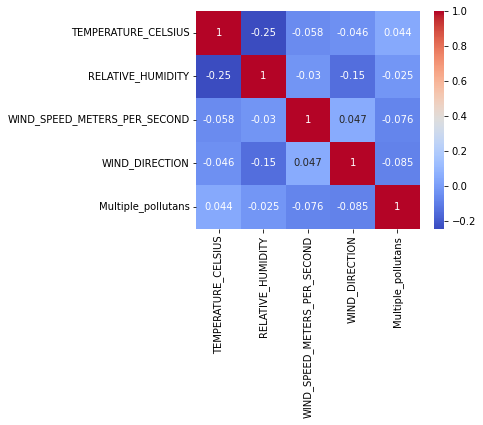

In [35]:
df_wt_mp= df_wt_mp[cpairplot_wt_allpolluttant]
#df_weather=pd.DataFrame(column_pairplot)
plt.figure(figsize=(5,4))
sns.heatmap(df_wt_mp.corr(),cmap='coolwarm',annot=True);

In [36]:
#setting date column as index
'''df_2019_cp.set_index('DATE',inplace=True)

df_2019.set_index('DATE',inplace=True)

pollutants=['OZONE_PPM','PM25_UG_PER_CUBIC_METER', 'NO2_PPB']
df_2019_p=df_2019_cp[pollutants]
print('Distribution of different pollutants in 2019')
df_2019_p.plot(kind='line',figsize=(18,18),cmap='coolwarm',subplots=True,fontsize=10);'''

"df_2019_cp.set_index('DATE',inplace=True)\n\ndf_2019.set_index('DATE',inplace=True)\n\npollutants=['OZONE_PPM','PM25_UG_PER_CUBIC_METER', 'NO2_PPB']\ndf_2019_p=df_2019_cp[pollutants]\nprint('Distribution of different pollutants in 2019')\ndf_2019_p.plot(kind='line',figsize=(18,18),cmap='coolwarm',subplots=True,fontsize=10);"

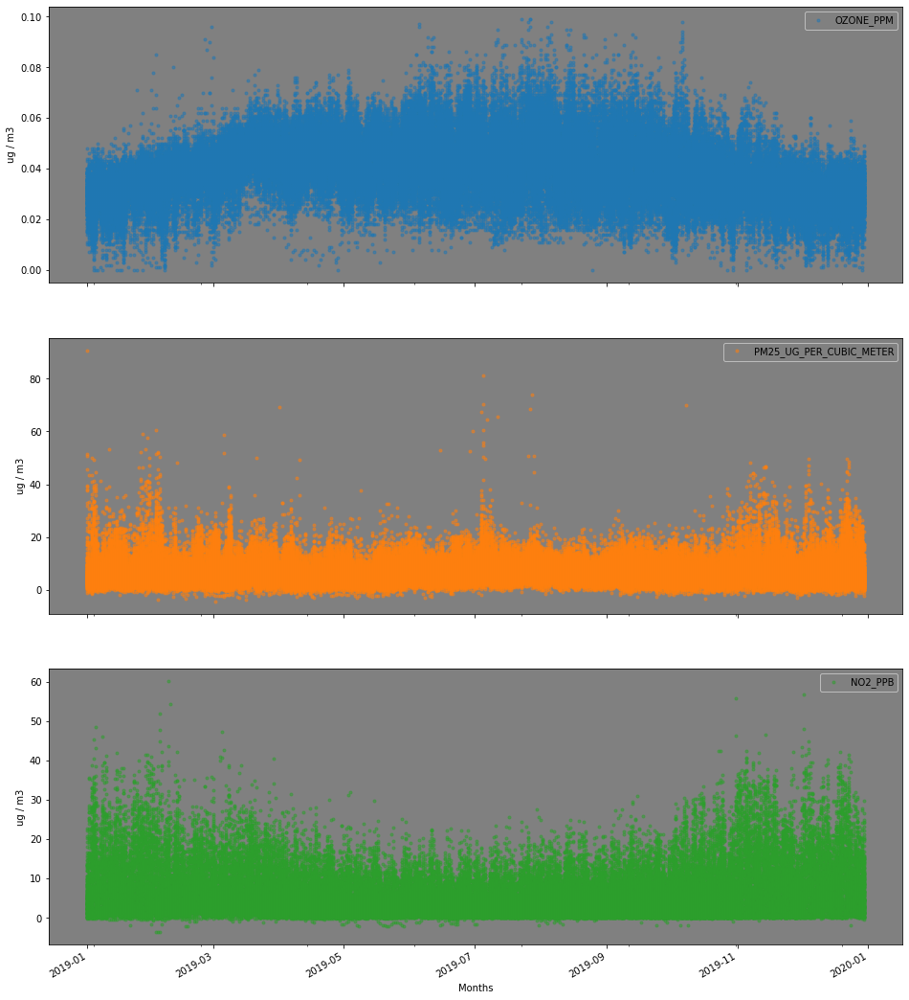

In [37]:
#city_day.set_index('Date',inplace=True)
pollutants=['OZONE_PPM','PM25_UG_PER_CUBIC_METER', 'NO2_PPB']
df_2019.set_index('DATE',inplace=True)

axes = df_2019[pollutants].plot(marker='.', alpha=0.5, linestyle='None', figsize=(16, 20), subplots=True)
for ax in axes:
    
    ax.set_xlabel('Months')
    ax.set_ylabel('ug / m3')

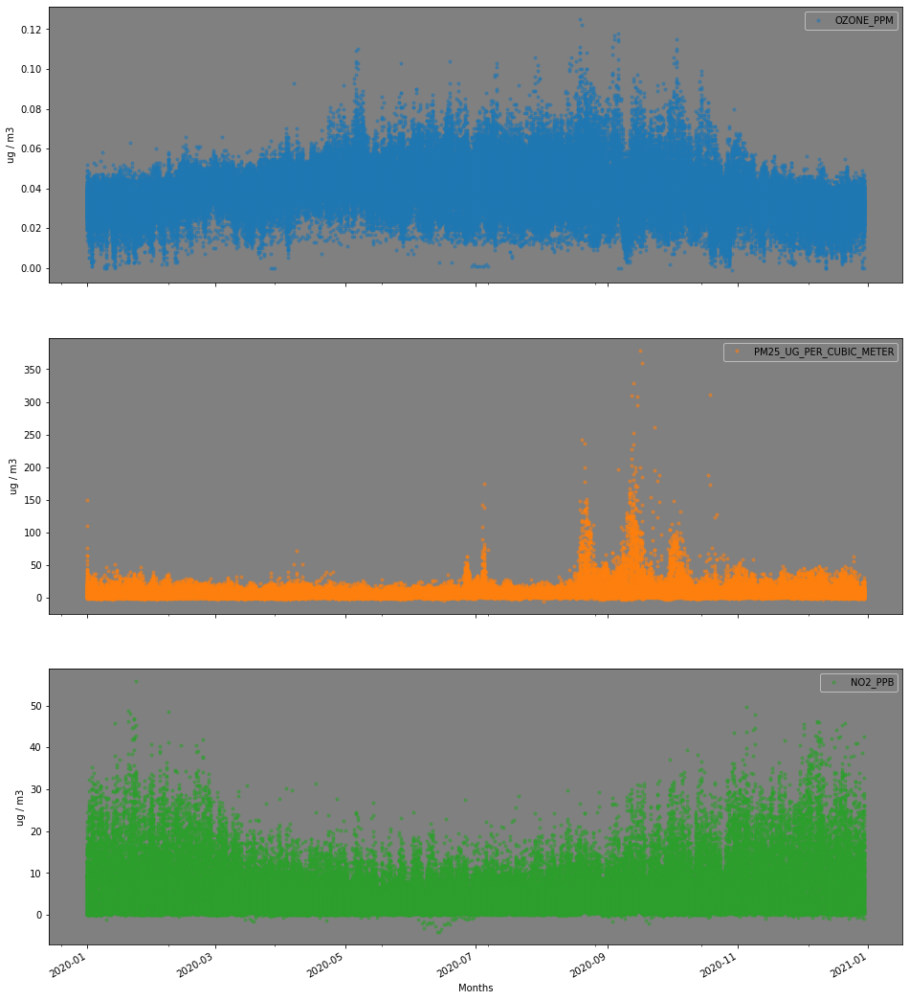

In [38]:
#df_2020_cp= df_2020.copy()
#df_2020_cp.set_index('DATE',inplace=True

df_2020.set_index('DATE',inplace=True)

axes = df_2020[pollutants].plot(marker='.', alpha=0.5, linestyle='None', figsize=(16, 20), subplots=True)
for ax in axes:
    ax.set_xlabel('Months')
    ax.set_ylabel('ug / m3')

In [39]:
def trend_plot(dataframe,value):
    
    # Prepare data
    #df['year'] = [d.year for d in df.DATE]
    df['month'] = [d.strftime('%m') for d in df.DATE]
    df['year'] = [d.strftime('%y') for d in df.DATE]
    #months = df['month'].unique()

    # Draw Plot
    fig, axes = plt.subplots(1,2,figsize=(14,6), dpi= 80)
    sns.boxplot(x='year', y=value, data=df, ax=axes[0])
    sns.pointplot(x='month', y=value, data=df.loc[~df.year.isin([2019, 2020]), :])

    # Set Title
    axes[0].set_title('Year-wise Box Plot \n(The Trend)', fontsize=18); 
    axes[1].set_title('Month-wise Plot \n(The Seasonality)', fontsize=18)
    plt.show()

In [40]:
#df_eap= df_2019.merge(df_2020, on='AQS_ID', how='inner')

df_2019 = pd.read_excel("Datathon_EPA_Air_Quality_Demographics_Meteorology_2019.xlsx")
df_2020 = pd.read_excel("Datathon_EPA_Air_Quality_Demographics_Meteorology_2020.xlsx")

df_eap= pd.concat([df_2019, df_2020])
df_eap.columns

Index(['AQS_ID', 'LATITUDE', 'LONGITUDE', 'COUNTY', 'STATE', 'CBSA',
       'PEOPLE_OF_COLOR_FRACTION', 'LOW_INCOME_FRACTION',
       'LINGUISTICALLY_ISOLATED_FRACTION', 'LESS_THAN_HS_ED_FRACTION', 'DATE',
       'TEMPERATURE_CELSIUS', 'RELATIVE_HUMIDITY',
       'WIND_SPEED_METERS_PER_SECOND', 'WIND_DIRECTION',
       'PM25_UG_PER_CUBIC_METER', 'OZONE_PPM', 'NO2_PPB', 'CO_PPM', 'SO2_PPB',
       'LEAD_UG_PER_CUBIC_METER', 'BENZENE_PPBC'],
      dtype='object')

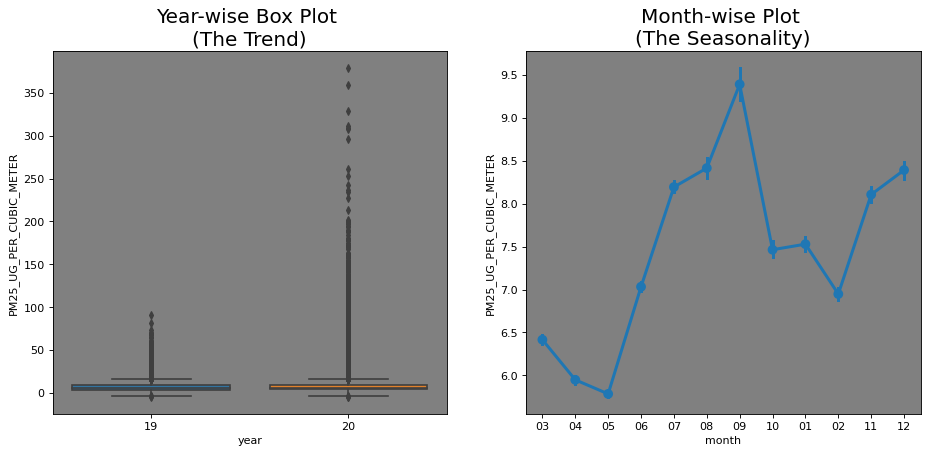

In [41]:

#PM25_UG_PER_CUBIC_METER reprsentation
from matplotlib.pyplot import *

df = df_eap
value='PM25_UG_PER_CUBIC_METER'
trend_plot(df,value)

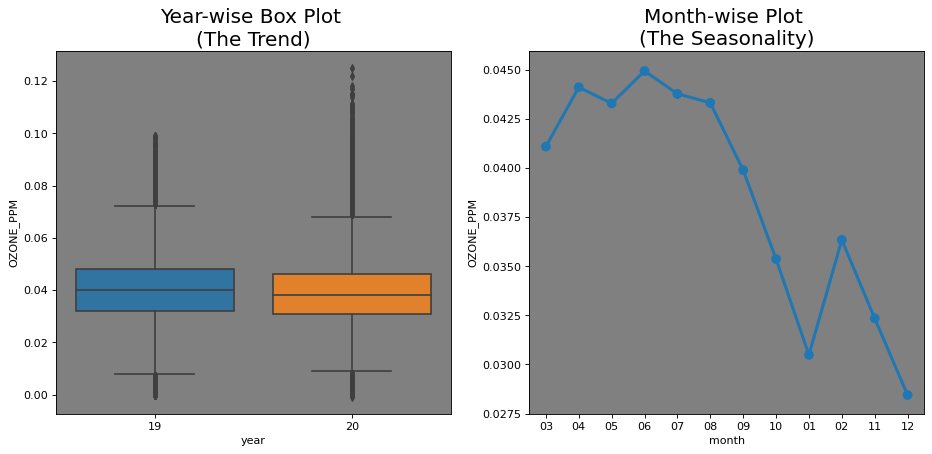

In [42]:
from matplotlib.pyplot import *

#OZONE_PPM reprsentation
df = df_eap
value='OZONE_PPM'
trend_plot(df,value)

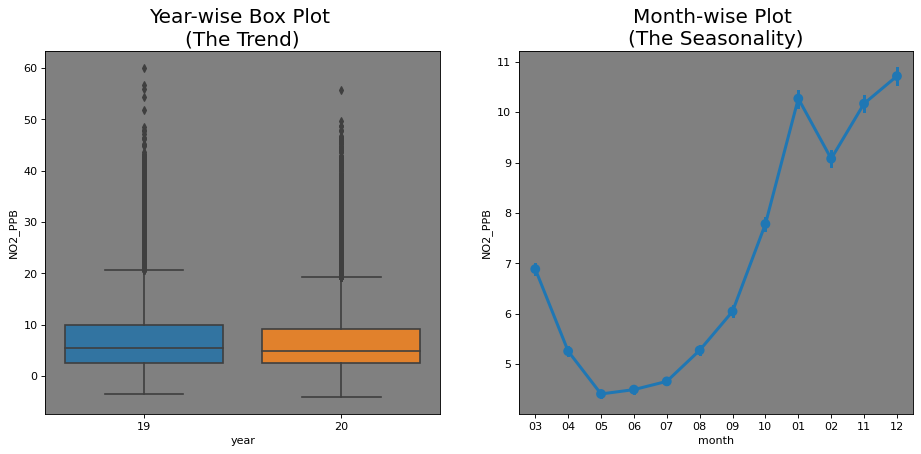

In [43]:
from matplotlib.pyplot import *

df = df_eap
value='NO2_PPB'
trend_plot(df,value)

#NO2

In [44]:
for i in df_eap.columns:
    print('column name:{}    unique values:{}'.format(i,len(df_eap[i].unique())))

column name:AQS_ID    unique values:525
column name:LATITUDE    unique values:525
column name:LONGITUDE    unique values:525
column name:COUNTY    unique values:355
column name:STATE    unique values:52
column name:CBSA    unique values:260
column name:PEOPLE_OF_COLOR_FRACTION    unique values:100
column name:LOW_INCOME_FRACTION    unique values:90
column name:LINGUISTICALLY_ISOLATED_FRACTION    unique values:39
column name:LESS_THAN_HS_ED_FRACTION    unique values:60
column name:DATE    unique values:729
column name:TEMPERATURE_CELSIUS    unique values:13759
column name:RELATIVE_HUMIDITY    unique values:10929
column name:WIND_SPEED_METERS_PER_SECOND    unique values:6313
column name:WIND_DIRECTION    unique values:27681
column name:PM25_UG_PER_CUBIC_METER    unique values:1045
column name:OZONE_PPM    unique values:119
column name:NO2_PPB    unique values:19516
column name:CO_PPM    unique values:21192
column name:SO2_PPB    unique values:3768
column name:LEAD_UG_PER_CUBIC_METER    u

In [45]:
#Combining all pollutants together
df_2019['all_poluttants']= df_2019['PM25_UG_PER_CUBIC_METER'] + df_2019['OZONE_PPM'] + df_2019['NO2_PPB']
df_2020['all_poluttants']= df_2020['PM25_UG_PER_CUBIC_METER'] + df_2020['OZONE_PPM'] + df_2020['NO2_PPB']

#Combining all demographics together
df_2019['all_demographics']= df_2019['PEOPLE_OF_COLOR_FRACTION'] + df_2019['LOW_INCOME_FRACTION'] + df_2019['LINGUISTICALLY_ISOLATED_FRACTION']  + df_2019['LESS_THAN_HS_ED_FRACTION']
df_2020['all_demographics']= df_2020['PEOPLE_OF_COLOR_FRACTION'] + df_2020['LOW_INCOME_FRACTION'] + df_2020['LINGUISTICALLY_ISOLATED_FRACTION']  + df_2020['LESS_THAN_HS_ED_FRACTION']

C:\Users\satou\AppData\Local\Temp\ipykernel_22480\809088000.py:1: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  df1=df_2020.groupby('STATE',as_index=False)['PEOPLE_OF_COLOR_FRACTION','LOW_INCOME_FRACTION'].mean()


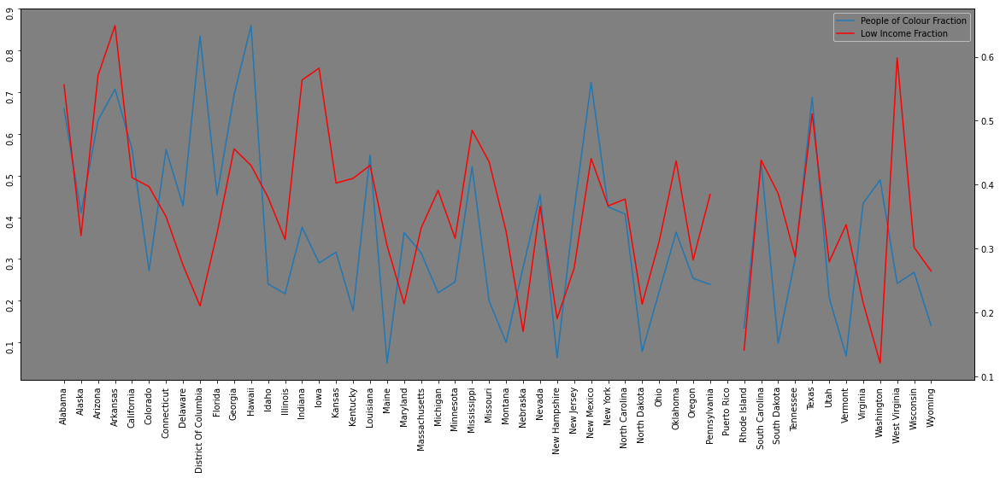

In [46]:
df1=df_2020.groupby('STATE',as_index=False)['PEOPLE_OF_COLOR_FRACTION','LOW_INCOME_FRACTION'].mean()

fig,(ax1)=plt.subplots(figsize=(20,8))

lns1=ax1.plot(df1.STATE,df1.PEOPLE_OF_COLOR_FRACTION,label='People of Colour Fraction')

ax2=ax1.twinx()

lns2=ax2.plot(df1.STATE,df1.LOW_INCOME_FRACTION,'r',label='Low Income Fraction')
lns=lns1+lns2
lab=[l.get_label()for l in lns]
ax1.legend(lns,lab,loc=0)
ax1.tick_params(labelrotation=90)

In [47]:
df_eap.head()

,AQS_ID,LATITUDE,LONGITUDE,COUNTY,STATE,CBSA,PEOPLE_OF_COLOR_FRACTION,LOW_INCOME_FRACTION,LINGUISTICALLY_ISOLATED_FRACTION,LESS_THAN_HS_ED_FRACTION,...,WIND_DIRECTION,PM25_UG_PER_CUBIC_METER,OZONE_PPM,NO2_PPB,CO_PPM,SO2_PPB,LEAD_UG_PER_CUBIC_METER,BENZENE_PPBC,month,year
0,01-003-0010,30.497478,-87.880258,Baldwin,Alabama,"Daphne-Fairhope-Foley, AL",0.13,0.26,0.0,0.03,...,NaN,3.8,0.029,NaN,NaN,NaN,NaN,NaN,03,19
1,01-003-0010,30.497478,-87.880258,Baldwin,Alabama,"Daphne-Fairhope-Foley, AL",0.13,0.26,0.0,0.03,...,NaN,6.5,0.034,NaN,NaN,NaN,NaN,NaN,03,19
2,01-003-0010,30.497478,-87.880258,Baldwin,Alabama,"Daphne-Fairhope-Foley, AL",0.13,0.26,0.0,0.03,...,NaN,8.6,0.053,NaN,NaN,NaN,NaN,NaN,03,19
3,01-003-0010,30.497478,-87.880258,Baldwin,Alabama,"Daphne-Fairhope-Foley, AL",0.13,0.26,0.0,0.03,...,NaN,7.5,0.030,NaN,NaN,NaN,NaN,NaN,03,19
4,01-003-0010,30.497478,-87.880258,Baldwin,Alabama,"Daphne-Fairhope-Foley, AL",0.13,0.26,0.0,0.03,...,NaN,8.8,0.046,NaN,NaN,NaN,NaN,NaN,03,19


In [48]:
#Most Polluted when using the Mean 2019
most_polluted_states = df_2019[['STATE','AQS_ID','PM25_UG_PER_CUBIC_METER','OZONE_PPM','NO2_PPB']].groupby(['STATE']).mean().sort_values(by = 'PM25_UG_PER_CUBIC_METER', ascending = False)
most_polluted_states

,PM25_UG_PER_CUBIC_METER,OZONE_PPM,NO2_PPB
STATE,,,
Georgia,9.522561,0.042493,9.403639
Alabama,9.221053,0.040603,9.731777
Arkansas,8.950756,0.036869,7.893044
Indiana,8.842862,0.036649,9.557975
Mississippi,8.819636,0.039991,5.589298
Texas,8.753661,0.037738,7.566816
Oklahoma,8.584974,0.040725,6.062598
Pennsylvania,8.317257,0.037542,4.973039
Ohio,8.296558,0.040829,9.947473


In [49]:
#Most Polluted States when using the sum - 2019
most_polluted_states = df_2019[['STATE','AQS_ID','PM25_UG_PER_CUBIC_METER','OZONE_PPM','NO2_PPB']].groupby(['STATE']).sum().sort_values(by = 'PM25_UG_PER_CUBIC_METER', ascending = False)
most_polluted_states

,PM25_UG_PER_CUBIC_METER,OZONE_PPM,NO2_PPB
STATE,,,
California,179583.5,991.755,124172.325315
Pennsylvania,83139.3,375.266,20384.486321
Texas,36704.1,158.235,23404.162964
Utah,34450.5,256.147,50106.162286
Indiana,28491.7,118.084,14422.984036
Florida,28315.6,145.155,2446.563395
Oklahoma,26338.7,124.943,3686.059585
Kentucky,25831.6,135.420,7757.562750
New Jersey,22948.0,110.957,18966.642953


In [50]:
#Most Polluted when using the Mean 2020
most_polluted_states = df_2020[['STATE','AQS_ID','PM25_UG_PER_CUBIC_METER','OZONE_PPM','NO2_PPB']].groupby(['STATE']).mean().sort_values(by = 'PM25_UG_PER_CUBIC_METER', ascending = False)
most_polluted_states

,PM25_UG_PER_CUBIC_METER,OZONE_PPM,NO2_PPB
STATE,,,
California,11.680927,0.040596,8.544943
Mississippi,9.272038,0.036972,3.785342
Alabama,8.788868,0.036464,8.208474
Oklahoma,8.667551,0.039728,5.130847
Texas,8.651225,0.037581,6.864012
Georgia,8.534119,0.035160,7.508622
Kansas,8.488117,0.036269,4.168742
Indiana,8.399789,0.035480,7.819657
Louisiana,7.980227,0.034952,6.865089


In [51]:
#Most Polluted States when using the sum - 2020
most_polluted_states = df_2020[['STATE','AQS_ID','PM25_UG_PER_CUBIC_METER','OZONE_PPM','NO2_PPB']].groupby(['STATE']).sum().sort_values(by = 'PM25_UG_PER_CUBIC_METER', ascending = False)
most_polluted_states

,PM25_UG_PER_CUBIC_METER,OZONE_PPM,NO2_PPB
STATE,,,
California,292128.3,1015.256,130934.162399
Pennsylvania,76716.1,361.079,25927.411807
Texas,41309.6,179.447,25211.516163
Utah,40729.8,235.512,48296.663344
Florida,35366.4,161.399,1939.227843
Nevada,34435.2,193.043,11561.369011
Arizona,27953.2,165.216,11577.023109
Indiana,27912.5,117.900,12918.073855
Oklahoma,25482.6,116.800,3365.835351


In [52]:
most_polluted_counties= df_2019[['COUNTY','AQS_ID','PM25_UG_PER_CUBIC_METER','OZONE_PPM','NO2_PPB']].groupby(['COUNTY']).mean().sort_values(by = 'PM25_UG_PER_CUBIC_METER', ascending = False)
most_polluted_counties

,PM25_UG_PER_CUBIC_METER,OZONE_PPM,NO2_PPB
COUNTY,,,
Tulare,12.927679,0.047179,9.615973
Kings,12.252059,0.045915,8.479283
Marion,11.177711,0.034667,10.884396
Gwinnett,10.720087,0.045175,NaN
Hidalgo,10.709714,0.031069,NaN
...,...,...,...
Park,2.723221,0.041116,1.895911
Custer,2.649580,0.042140,NaN
Fremont,2.631893,0.045955,0.526285


In [53]:
def max_polluted_states(pollutant):
    table = df_2019[[pollutant,'STATE']].groupby(["STATE"]).mean().sort_values(by=pollutant,ascending=False).reset_index()
    return table[:5].style.background_gradient(cmap='Reds')

print("States having worst levelss of each pollutant-")
for pollutant in pollutants:
    df = max_polluted_states(pollutant)
    display(df)

States having worst levelss of each pollutant-


,STATE,OZONE_PPM
0,New Mexico,0.047312
1,Arizona,0.045636
2,Wyoming,0.044623
3,Nevada,0.044509
4,Colorado,0.043934


,STATE,PM25_UG_PER_CUBIC_METER
0,Georgia,9.522561
1,Alabama,9.221053
2,Arkansas,8.950756
3,Indiana,8.842862
4,Mississippi,8.819636


,STATE,NO2_PPB
0,New York,14.629120
1,Illinois,12.820744
2,Nevada,11.898030
3,District Of Columbia,11.445252
4,Arizona,11.348159


In [54]:
features = df_2019.columns

In [55]:
ga = df_2019[(df_2019['STATE']=='Georgia')].reset_index(drop=True)
ga.head(2)

,AQS_ID,LATITUDE,LONGITUDE,COUNTY,STATE,CBSA,PEOPLE_OF_COLOR_FRACTION,LOW_INCOME_FRACTION,LINGUISTICALLY_ISOLATED_FRACTION,LESS_THAN_HS_ED_FRACTION,...,WIND_DIRECTION,PM25_UG_PER_CUBIC_METER,OZONE_PPM,NO2_PPB,CO_PPM,SO2_PPB,LEAD_UG_PER_CUBIC_METER,BENZENE_PPBC,all_poluttants,all_demographics
0,13-021-0012,32.805264,-83.543493,Bibb,Georgia,"Macon, GA",0.47,0.51,0.0,0.24,...,244.416667,5.0,0.022,NaN,NaN,1.058333,NaN,NaN,NaN,1.22
1,13-021-0012,32.805264,-83.543493,Bibb,Georgia,"Macon, GA",0.47,0.51,0.0,0.24,...,248.083333,7.7,0.020,NaN,NaN,1.108333,NaN,NaN,NaN,1.22


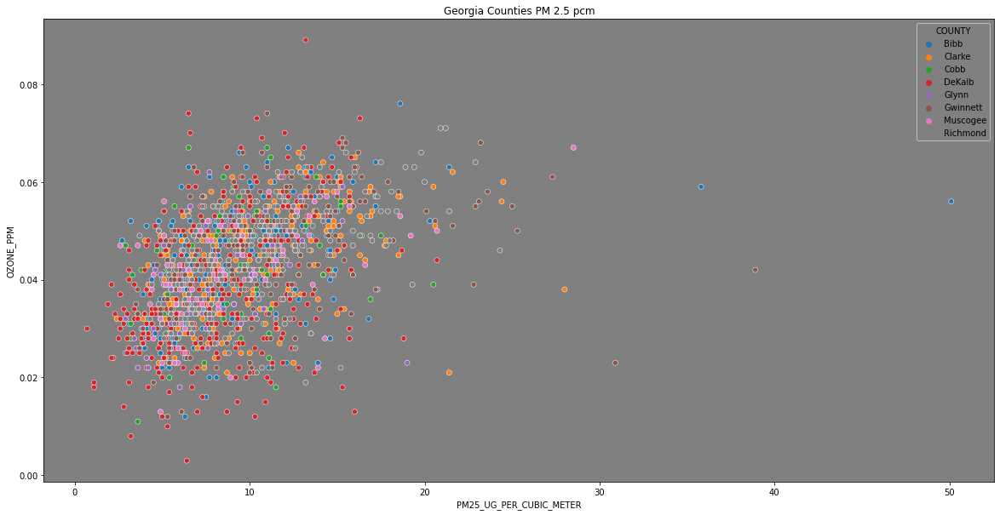

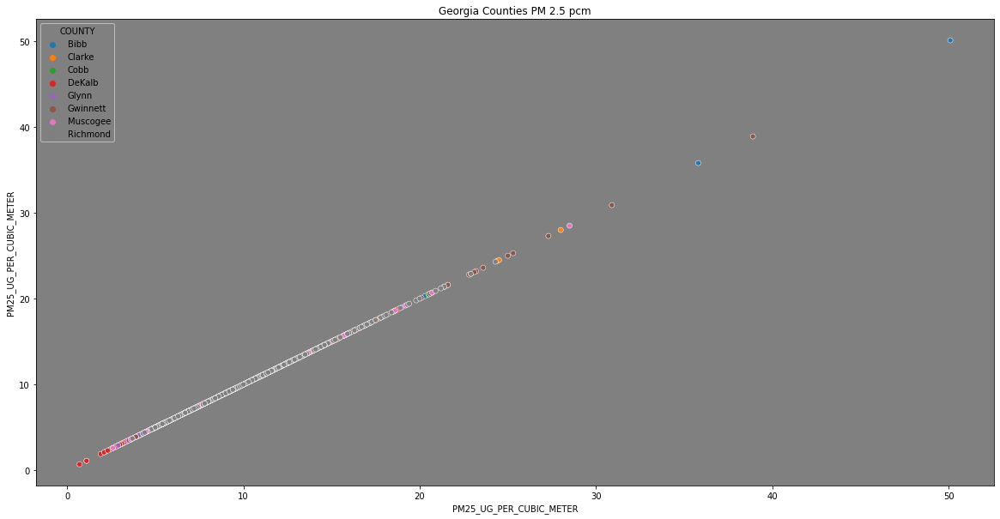

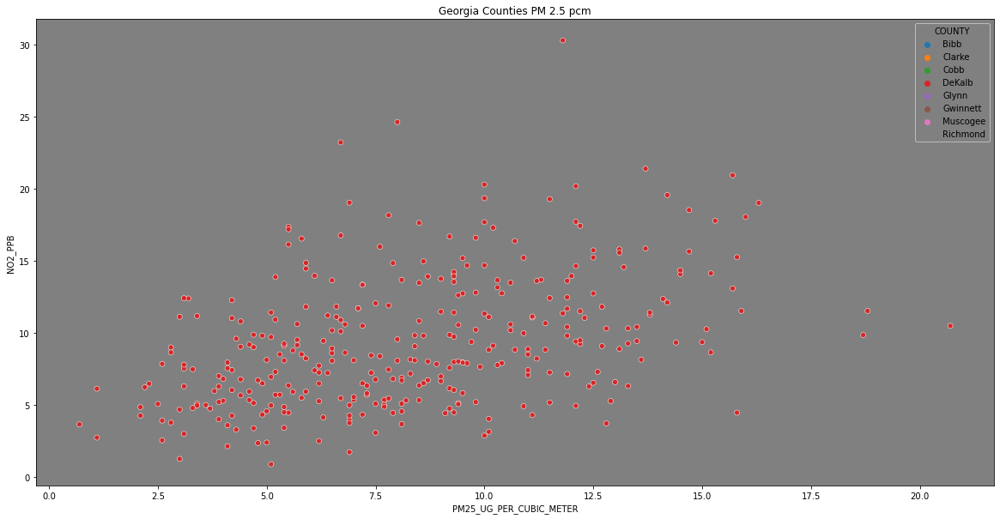

In [56]:
for pollutant in pollutants:
    fig, ax = plt.subplots(figsize=(20, 10))
    sns.scatterplot(data=ga, x="PM25_UG_PER_CUBIC_METER", y=pollutant, hue="COUNTY")
    plt.title('Georgia Counties PM 2.5 pcm')
    plt.show()

In [57]:
'PM25_UG_PER_CUBIC_METER','OZONE_PPM','NO2_PPB'

('PM25_UG_PER_CUBIC_METER', 'OZONE_PPM', 'NO2_PPB')

In [58]:
def max_polluted_counties(pollutant):
    table = df_2019[[pollutant,'COUNTY']].groupby(["COUNTY"]).mean().sort_values(by=pollutant,ascending=False).reset_index()
    return table[:5].style.background_gradient(cmap='Reds')

print("Counties having worst levelss of each pollutant-")
for pollutant in pollutants:
    df = max_polluted_counties(pollutant)
    display(df)

Counties having worst levelss of each pollutant-


,COUNTY,OZONE_PPM
0,San Bernardino,0.052918
1,Riverside,0.051782
2,La Plata,0.050583
3,Duchesne,0.049837
4,Kern,0.049104


,COUNTY,PM25_UG_PER_CUBIC_METER
0,Tulare,12.927679
1,Kings,12.252059
2,Marion,11.177711
3,Gwinnett,10.720087
4,Hidalgo,10.709714


,COUNTY,NO2_PPB
0,Denver,18.076715
1,Bronx,15.080874
2,Weber,14.583841
3,Cook,14.221415
4,Queens,14.116353


In [59]:
df_2019.columns

Index(['AQS_ID', 'LATITUDE', 'LONGITUDE', 'COUNTY', 'STATE', 'CBSA',
       'PEOPLE_OF_COLOR_FRACTION', 'LOW_INCOME_FRACTION',
       'LINGUISTICALLY_ISOLATED_FRACTION', 'LESS_THAN_HS_ED_FRACTION', 'DATE',
       'TEMPERATURE_CELSIUS', 'RELATIVE_HUMIDITY',
       'WIND_SPEED_METERS_PER_SECOND', 'WIND_DIRECTION',
       'PM25_UG_PER_CUBIC_METER', 'OZONE_PPM', 'NO2_PPB', 'CO_PPM', 'SO2_PPB',
       'LEAD_UG_PER_CUBIC_METER', 'BENZENE_PPBC', 'all_poluttants',
       'all_demographics'],
      dtype='object')

In [60]:
#Creating a dataframe for each of the county in the PM Matter
df_Tulare= df_2019[df_2019['COUNTY']== 'Tulare']
df_Kings= df_2019[df_2019['COUNTY']== 'Kings']
df_Marion= df_2019[df_2019['COUNTY']== 'Marion']
df_Gwinnett= df_2019[df_2019['COUNTY']== 'Gwinnett']
df_Hidalgo= df_2019[df_2019['COUNTY']== 'Hidalgo']

In [61]:
df_2019 = pd.read_excel("Datathon_EPA_Air_Quality_Demographics_Meteorology_2019.xlsx")

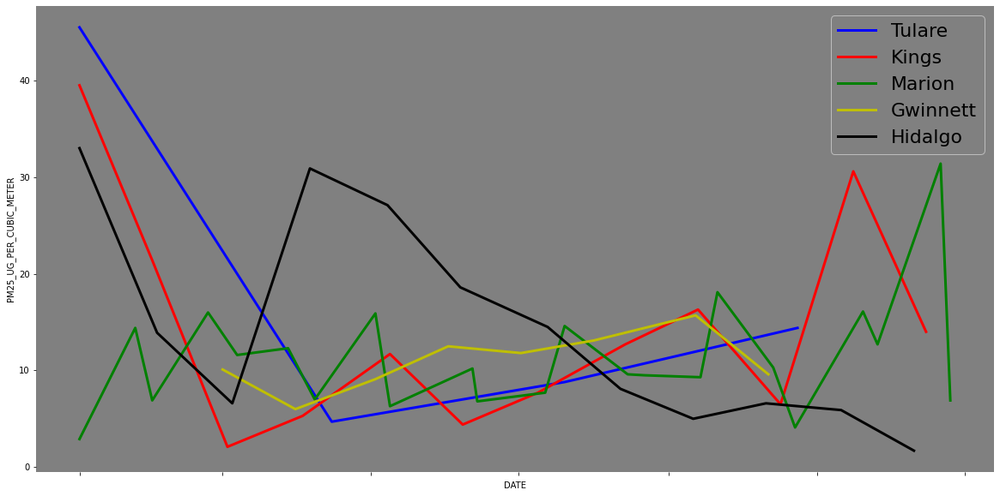

In [62]:
fig,ax = plt.subplots(figsize=(20, 10))
sns.despine(fig, left=True, bottom=True)
sns.set_context("notebook", font_scale=2, rc={"lines.linewidth": 3})

sns.lineplot(x="DATE", y="PM25_UG_PER_CUBIC_METER", data=df_Tulare.iloc[::30], color="b",label = 'Tulare')
sns.lineplot(x="DATE", y="PM25_UG_PER_CUBIC_METER", data=df_Kings.iloc  [::30], color="r",label = 'Kings')
sns.lineplot(x="DATE", y="PM25_UG_PER_CUBIC_METER", data=df_Marion.iloc[::30], color="g",label = 'Marion')
sns.lineplot(x="DATE", y="PM25_UG_PER_CUBIC_METER", data=df_Gwinnett.iloc[::30], color="y",label = 'Gwinnett')
sns.lineplot(x="DATE", y="PM25_UG_PER_CUBIC_METER", data=df_Hidalgo.iloc[::30], color="black",label = 'Hidalgo')

labels = [item.get_text() for item in ax.get_xticklabels()]
labels[1] = 'January 2019 to December 2019'
ax.set_xticklabels(ax.get_xticklabels(labels), rotation=30,ha="left")
plt.rcParams["xtick.labelsize"] = 15



In [63]:
df_2019 = pd.read_excel("Datathon_EPA_Air_Quality_Demographics_Meteorology_2019.xlsx")
df_2019['Year_Month'] = df_2019.DATE.apply(lambda x : x.strftime('%Y-%m'))

In [64]:
df_2020 = pd.read_excel("Datathon_EPA_Air_Quality_Demographics_Meteorology_2020.xlsx")
df_2020['Year_Month'] = df_2020.DATE.apply(lambda x : x.strftime('%Y-%m'))

def pollutant_trend_plot_pm(df):
    
    pollutants_an=['COUNTY','DATE','OZONE_PPM','PM25_UG_PER_CUBIC_METER', 'NO2_PPB']
    pollutant_time= df[pollutants_an]

#pollutant_time.set_index('DATE',inplace=True)
    pollutant_time['Year_Month'] = pollutant_time.DATE.apply(lambda x : x.strftime('%Y-%m'))
    df = pollutant_time.groupby(['Year_Month']).sum().reset_index()

# let's only see those that are important to the AQI
# otherwise we will have a messy plot

    corr_with_pollutant = pollutant_time.corr().PM25_UG_PER_CUBIC_METER.sort_values(ascending = False)

    metrices = corr_with_pollutant[corr_with_pollutant>0.5].index

    plt.style.use('seaborn-whitegrid');
    fig, ax_ = plt.subplots(figsize=(20,10));

    df = pollutant_time.groupby(['Year_Month']).sum().reset_index()

    for col in metrices:
        x = df['Year_Month']
        y = df[col]
    
    ax_.plot_date(x ,y ,label=col, linestyle="-");
    
    ax_.set_xticklabels(df['Year_Month'], rotation=85);
    ax_.legend();

C:\Users\satou\AppData\Local\Temp\ipykernel_22480\4136326495.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pollutant_time['Year_Month'] = pollutant_time.DATE.apply(lambda x : x.strftime('%Y-%m'))
C:\Users\satou\AppData\Local\Temp\ipykernel_22480\4136326495.py:31: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax_.set_xticklabels(df['Year_Month'], rotation=85);


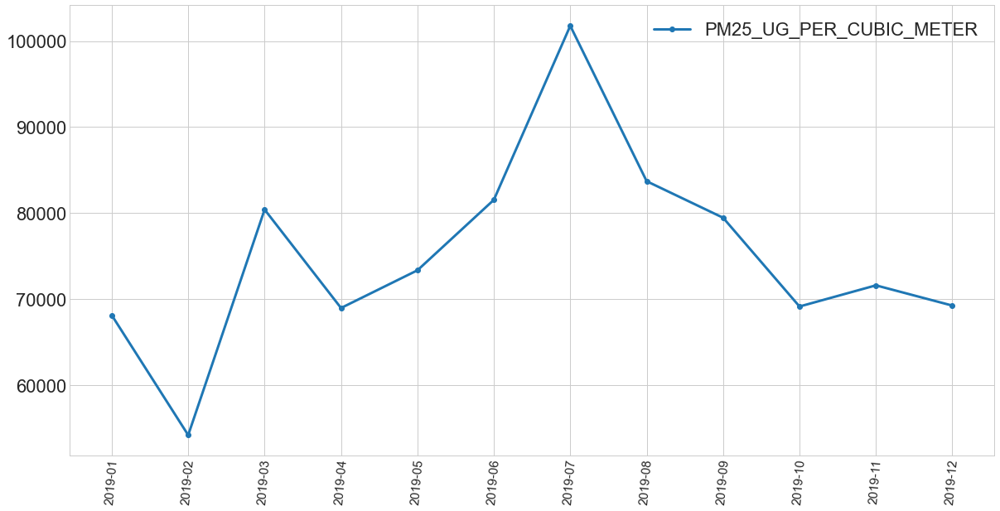

In [65]:
pollutant_trend_plot_pm(df_2019)

C:\Users\satou\AppData\Local\Temp\ipykernel_22480\4136326495.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pollutant_time['Year_Month'] = pollutant_time.DATE.apply(lambda x : x.strftime('%Y-%m'))
C:\Users\satou\AppData\Local\Temp\ipykernel_22480\4136326495.py:31: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax_.set_xticklabels(df['Year_Month'], rotation=85);


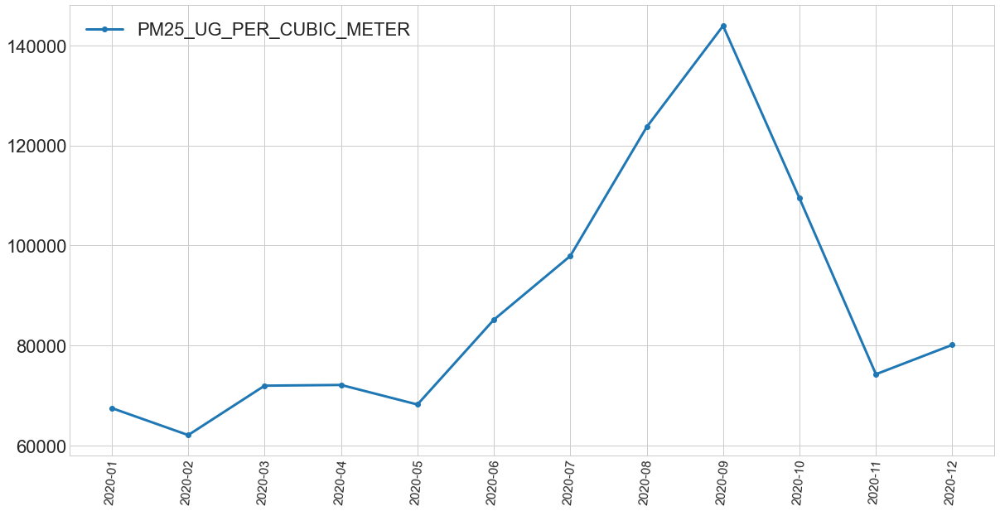

In [66]:
pollutant_trend_plot_pm(df_2020)

In [67]:
def pollutant_trend_plot_oz(df):
    
    pollutants_an=['COUNTY','DATE','OZONE_PPM','PM25_UG_PER_CUBIC_METER', 'NO2_PPB']
    pollutant_time= df[pollutants_an]

#pollutant_time.set_index('DATE',inplace=True)
    pollutant_time['Year_Month'] = pollutant_time.DATE.apply(lambda x : x.strftime('%Y-%m'))
    df = pollutant_time.groupby(['Year_Month']).sum().reset_index()

# let's only see those that are important to the AQI
# otherwise we will have a messy plot

    corr_with_pollutant = pollutant_time.corr().OZONE_PPM.sort_values(ascending = False)

    metrices = corr_with_pollutant[corr_with_pollutant>0.5].index

    plt.style.use('seaborn-whitegrid');
    fig, ax_ = plt.subplots(figsize=(20,10));

    df = pollutant_time.groupby(['Year_Month']).sum().reset_index()

    for col in metrices:
        x = df['Year_Month']
        y = df[col]
    
    ax_.plot_date(x ,y ,label=col, linestyle="-");
    
    ax_.set_xticklabels(df['Year_Month'], rotation=85);
    ax_.legend();

C:\Users\satou\AppData\Local\Temp\ipykernel_22480\2602803540.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pollutant_time['Year_Month'] = pollutant_time.DATE.apply(lambda x : x.strftime('%Y-%m'))
C:\Users\satou\AppData\Local\Temp\ipykernel_22480\2602803540.py:28: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax_.set_xticklabels(df['Year_Month'], rotation=85);


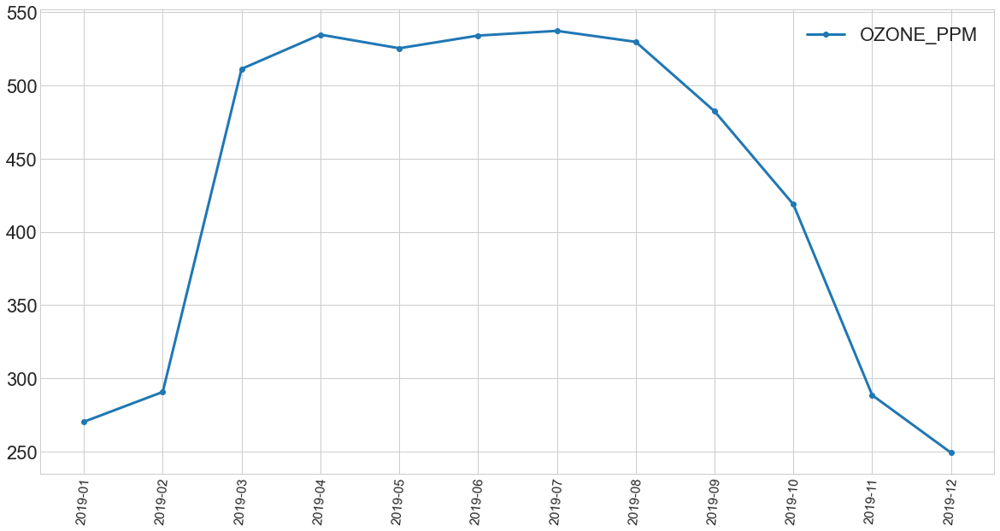

In [68]:
pollutant_trend_plot_oz(df_2019)

C:\Users\satou\AppData\Local\Temp\ipykernel_22480\2602803540.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pollutant_time['Year_Month'] = pollutant_time.DATE.apply(lambda x : x.strftime('%Y-%m'))
C:\Users\satou\AppData\Local\Temp\ipykernel_22480\2602803540.py:28: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax_.set_xticklabels(df['Year_Month'], rotation=85);


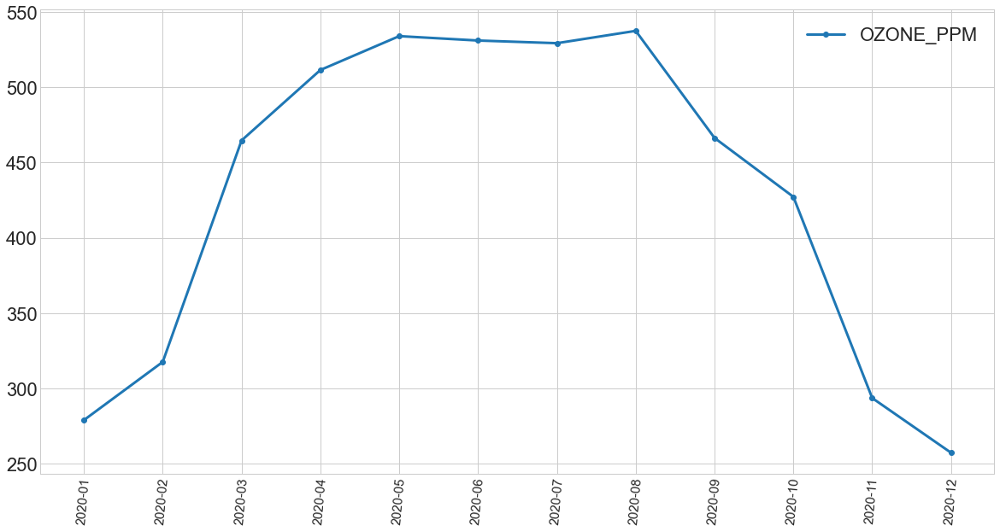

In [69]:
pollutant_trend_plot_oz(df_2020)

In [70]:
def pollutant_trend_plot_no(df):
    
    pollutants_an=['COUNTY','DATE','OZONE_PPM','PM25_UG_PER_CUBIC_METER', 'NO2_PPB']
    pollutant_time= df[pollutants_an]

#pollutant_time.set_index('DATE',inplace=True)
    pollutant_time['Year_Month'] = pollutant_time.DATE.apply(lambda x : x.strftime('%Y-%m'))
    df = pollutant_time.groupby(['Year_Month']).sum().reset_index()

# let's only see those that are important to the AQI
# otherwise we will have a messy plot

    corr_with_pollutant = pollutant_time.corr().NO2_PPB.sort_values(ascending = False)

    metrices = corr_with_pollutant[corr_with_pollutant>0.5].index

    plt.style.use('seaborn-whitegrid');
    fig, ax_ = plt.subplots(figsize=(20,10));

    df = pollutant_time.groupby(['Year_Month']).sum().reset_index()

    for col in metrices:
        x = df['Year_Month']
        y = df[col]
    
    ax_.plot_date(x ,y ,label=col, linestyle="-");
    
    ax_.set_xticklabels(df['Year_Month'], rotation=85);
    ax_.legend();

C:\Users\satou\AppData\Local\Temp\ipykernel_22480\1689071883.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pollutant_time['Year_Month'] = pollutant_time.DATE.apply(lambda x : x.strftime('%Y-%m'))
C:\Users\satou\AppData\Local\Temp\ipykernel_22480\1689071883.py:28: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax_.set_xticklabels(df['Year_Month'], rotation=85);


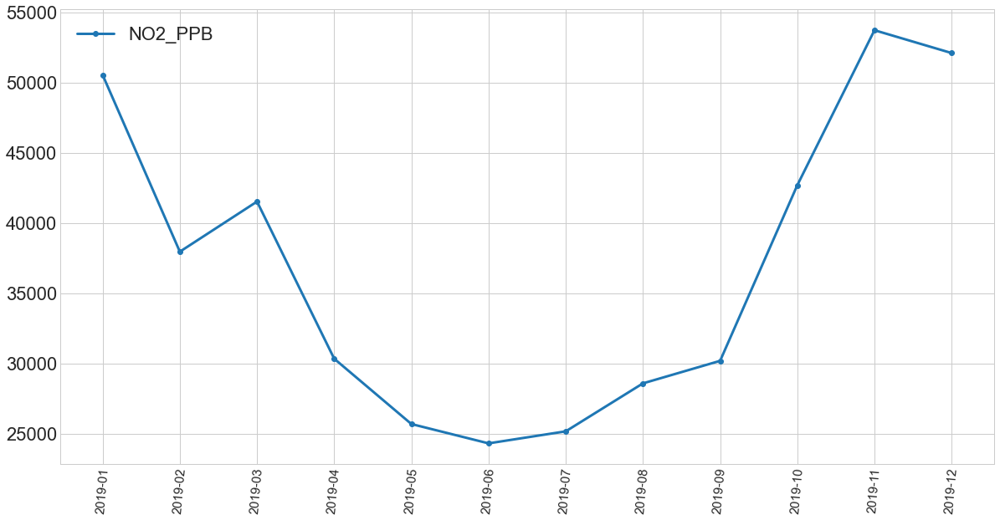

In [71]:
pollutant_trend_plot_no(df_2019)

C:\Users\satou\AppData\Local\Temp\ipykernel_22480\1689071883.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pollutant_time['Year_Month'] = pollutant_time.DATE.apply(lambda x : x.strftime('%Y-%m'))
C:\Users\satou\AppData\Local\Temp\ipykernel_22480\1689071883.py:28: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax_.set_xticklabels(df['Year_Month'], rotation=85);


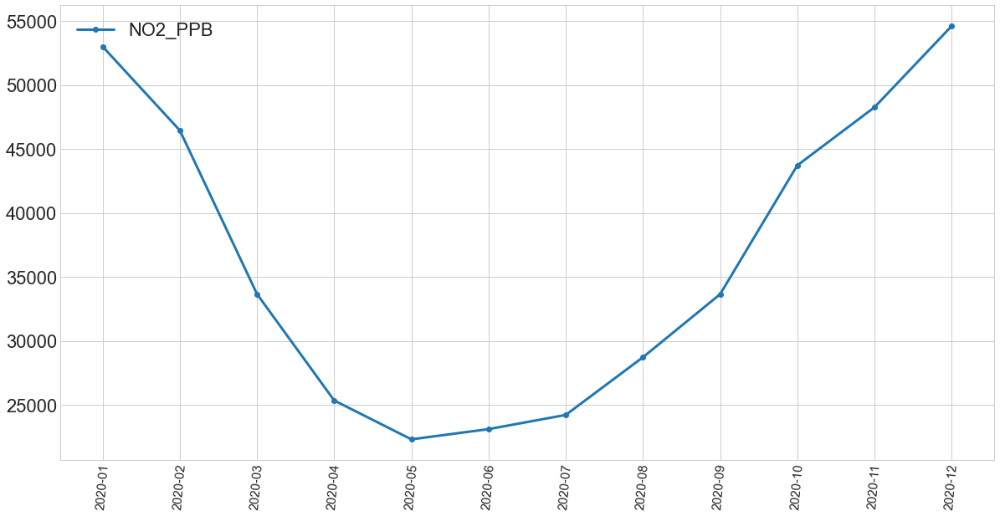

In [72]:
pollutant_trend_plot_no(df_2020)

C:\Users\satou\AppData\Local\Temp\ipykernel_22480\780379393.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Georgia_State['month']=Georgia_State.index.month
C:\Users\satou\AppData\Local\Temp\ipykernel_22480\780379393.py:6: FutureWarning: weekofyear and week have been deprecated, please use DatetimeIndex.isocalendar().week instead, which returns a Series. To exactly reproduce the behavior of week and weekofyear and return an Index, you may call pd.Int64Index(idx.isocalendar().week)
  Georgia_State['week']=Georgia_State.index.week
C:\Users\satou\AppData\Local\Temp\ipykernel_22480\780379393.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

Se

PM25 distribution in Georgia


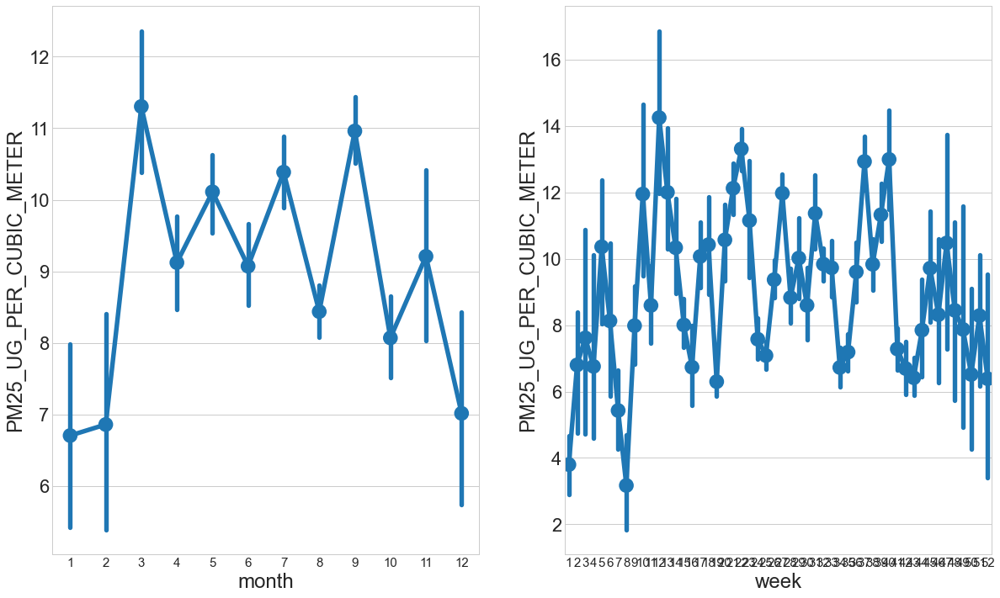

In [73]:
df_2019_cp= df_2019.copy()
df_2019_cp.set_index('DATE',inplace=True)

Georgia_State = df_2019_cp[df_2019_cp['STATE']=='Georgia']
Georgia_State['month']=Georgia_State.index.month
Georgia_State['week']=Georgia_State.index.week
print("PM25 distribution in Georgia")
fig,axes=plt.subplots(1,2,figsize=(20,12))
sns.pointplot(x='month',y='PM25_UG_PER_CUBIC_METER',data=Georgia_State,ax=axes[0])
sns.pointplot(x='week',y='PM25_UG_PER_CUBIC_METER',data=Georgia_State,ax=axes[1]);

C:\Users\satou\AppData\Local\Temp\ipykernel_22480\1318739015.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Georgia_State['month']=Georgia_State.index.month
C:\Users\satou\AppData\Local\Temp\ipykernel_22480\1318739015.py:5: FutureWarning: weekofyear and week have been deprecated, please use DatetimeIndex.isocalendar().week instead, which returns a Series. To exactly reproduce the behavior of week and weekofyear and return an Index, you may call pd.Int64Index(idx.isocalendar().week)
  Georgia_State['week']=Georgia_State.index.week
C:\Users\satou\AppData\Local\Temp\ipykernel_22480\1318739015.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead


PM25 distribution in Georgia


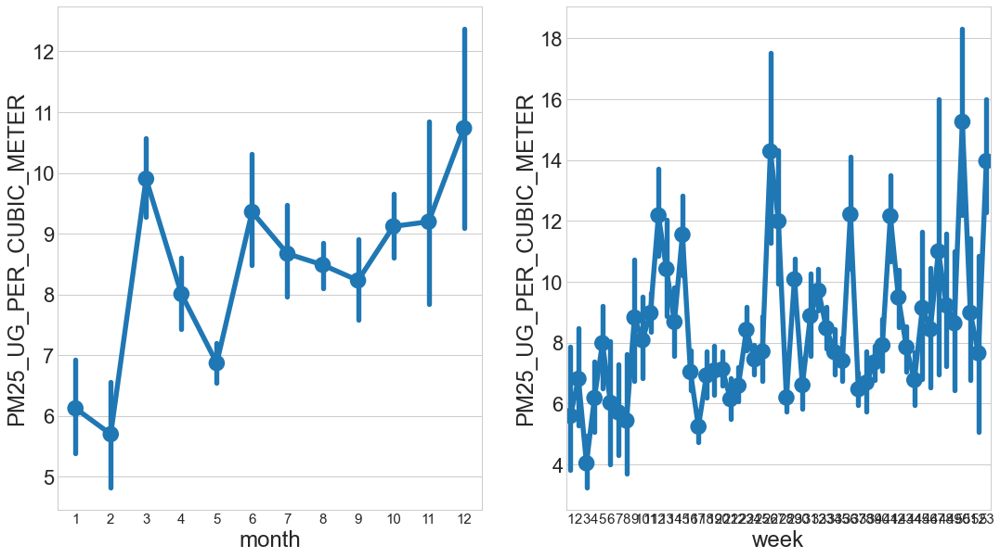

In [74]:
df_2020_cp= df_2020.copy()
df_2020_cp.set_index('DATE',inplace=True)
Georgia_State = df_2020_cp[df_2020_cp['STATE']=='Georgia']
Georgia_State['month']=Georgia_State.index.month
Georgia_State['week']=Georgia_State.index.week
print("PM25 distribution in Georgia")
fig,axes=plt.subplots(1,2,figsize=(18,10))
sns.pointplot(x='month',y='PM25_UG_PER_CUBIC_METER',data=Georgia_State,ax=axes[0])
sns.pointplot(x='week',y='PM25_UG_PER_CUBIC_METER',data=Georgia_State,ax=axes[1]);

In [75]:
def state_plot_pm(df, value):
    #df_2020_cp= df_2020.copy()
    #df_2020_cp.set_index('DATE',inplace=True)
    State_name = df[df['STATE']==value]
    State_name['month']=State_name.index.month
    State_name['week']=State_name.index.week
    print("PM25 distribution in" + value)
    fig,axes=plt.subplots(1,2,figsize=(18,10))
    sns.pointplot(x='month',y='PM25_UG_PER_CUBIC_METER',data=State_name,ax=axes[0])
    sns.pointplot(x='week',y='PM25_UG_PER_CUBIC_METER',data=State_name,ax=axes[1]);

C:\Users\satou\AppData\Local\Temp\ipykernel_22480\648299878.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  State_name['month']=State_name.index.month
C:\Users\satou\AppData\Local\Temp\ipykernel_22480\648299878.py:6: FutureWarning: weekofyear and week have been deprecated, please use DatetimeIndex.isocalendar().week instead, which returns a Series. To exactly reproduce the behavior of week and weekofyear and return an Index, you may call pd.Int64Index(idx.isocalendar().week)
  State_name['week']=State_name.index.week
C:\Users\satou\AppData\Local\Temp\ipykernel_22480\648299878.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveat

PM25 distribution inNew York


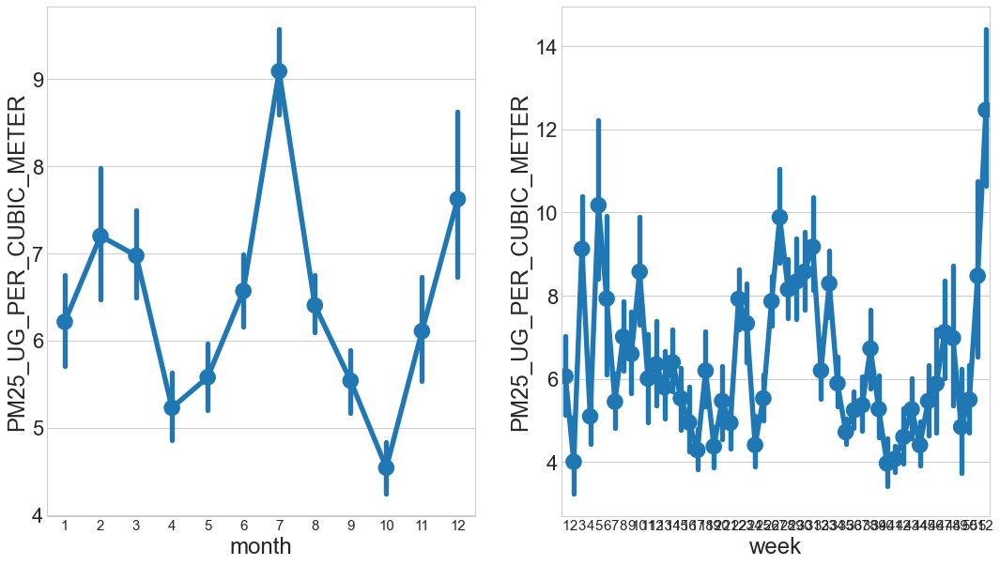

In [76]:
state_plot_pm(df_2019_cp, 'New York')

C:\Users\satou\AppData\Local\Temp\ipykernel_22480\648299878.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  State_name['month']=State_name.index.month
C:\Users\satou\AppData\Local\Temp\ipykernel_22480\648299878.py:6: FutureWarning: weekofyear and week have been deprecated, please use DatetimeIndex.isocalendar().week instead, which returns a Series. To exactly reproduce the behavior of week and weekofyear and return an Index, you may call pd.Int64Index(idx.isocalendar().week)
  State_name['week']=State_name.index.week
C:\Users\satou\AppData\Local\Temp\ipykernel_22480\648299878.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveat

PM25 distribution inNew York


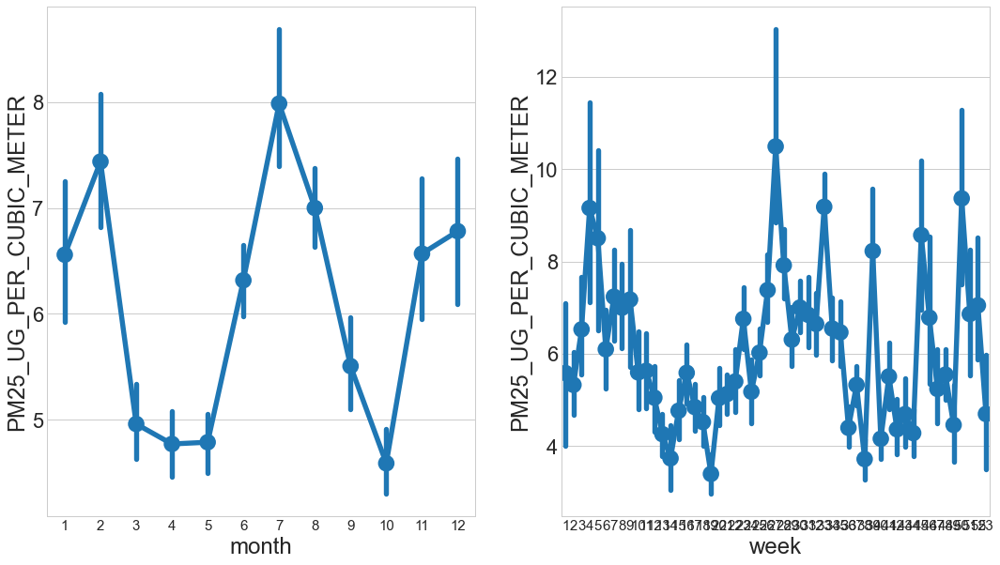

In [77]:
state_plot_pm(df_2020_cp, 'New York')

In [78]:
def state_plot_oz(df, value):
    #df_2020_cp= df_2020.copy()
    #df_2020_cp.set_index('DATE',inplace=True)
    State_name = df[df['STATE']==value]
    State_name['month']=State_name.index.month
    State_name['week']=State_name.index.week
    print("Ozone distribution in" + value)
    fig,axes=plt.subplots(1,2,figsize=(18,10))
    sns.pointplot(x='month',y='OZONE_PPM',data=State_name,ax=axes[0])
    sns.pointplot(x='week',y='OZONE_PPM',data=State_name,ax=axes[1]);

C:\Users\satou\AppData\Local\Temp\ipykernel_22480\2291922331.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  State_name['month']=State_name.index.month
C:\Users\satou\AppData\Local\Temp\ipykernel_22480\2291922331.py:6: FutureWarning: weekofyear and week have been deprecated, please use DatetimeIndex.isocalendar().week instead, which returns a Series. To exactly reproduce the behavior of week and weekofyear and return an Index, you may call pd.Int64Index(idx.isocalendar().week)
  State_name['week']=State_name.index.week
C:\Users\satou\AppData\Local\Temp\ipykernel_22480\2291922331.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the cav

Ozone distribution inNew York


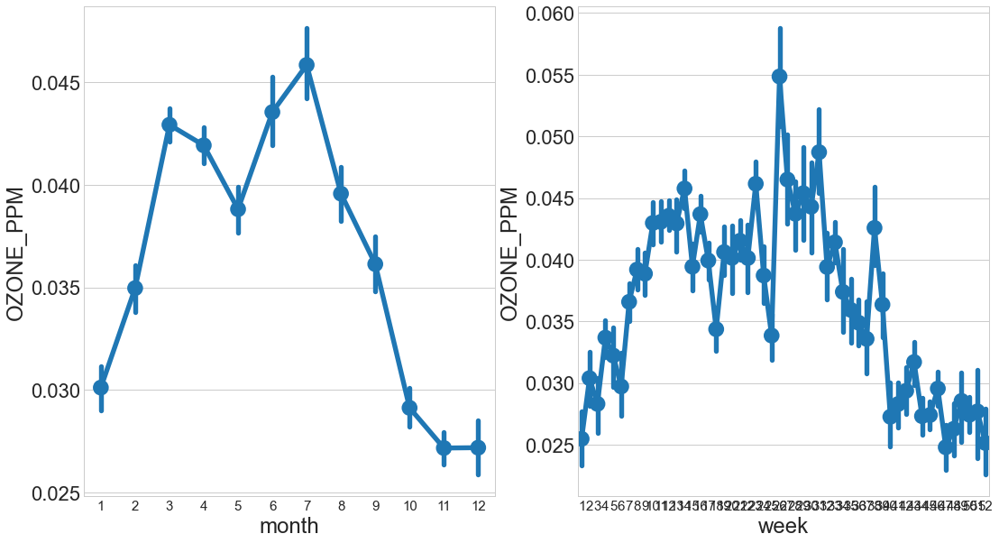

In [79]:
state_plot_oz(df_2019_cp, 'New York')

C:\Users\satou\AppData\Local\Temp\ipykernel_22480\2291922331.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  State_name['month']=State_name.index.month
C:\Users\satou\AppData\Local\Temp\ipykernel_22480\2291922331.py:6: FutureWarning: weekofyear and week have been deprecated, please use DatetimeIndex.isocalendar().week instead, which returns a Series. To exactly reproduce the behavior of week and weekofyear and return an Index, you may call pd.Int64Index(idx.isocalendar().week)
  State_name['week']=State_name.index.week
C:\Users\satou\AppData\Local\Temp\ipykernel_22480\2291922331.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the cav

Ozone distribution inNew York


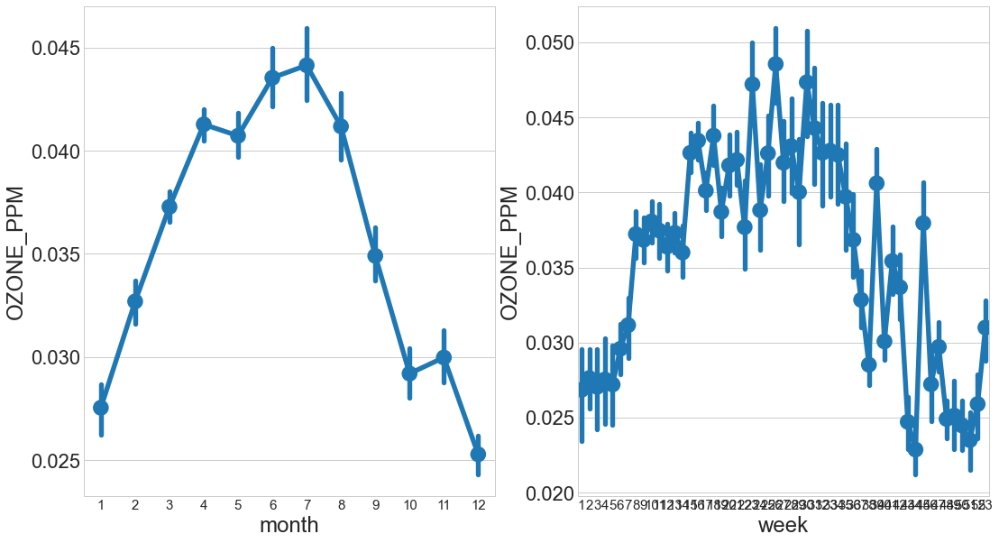

In [80]:
state_plot_oz(df_2020_cp, 'New York')

In [81]:
def state_plot_no(df, value):
    #df_2020_cp= df_2020.copy()
    #df_2020_cp.set_index('DATE',inplace=True)
    State_name = df[df['STATE']==value]
    State_name['month']=State_name.index.month
    State_name['week']=State_name.index.week
    print("NO2 distribution in"  + value)
    fig,axes=plt.subplots(1,2,figsize=(18,10))
    sns.pointplot(x='month',y='NO2_PPB',data=State_name,ax=axes[0])
    sns.pointplot(x='week',y='NO2_PPB',data=State_name,ax=axes[1]);

C:\Users\satou\AppData\Local\Temp\ipykernel_22480\3825994908.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  State_name['month']=State_name.index.month
C:\Users\satou\AppData\Local\Temp\ipykernel_22480\3825994908.py:6: FutureWarning: weekofyear and week have been deprecated, please use DatetimeIndex.isocalendar().week instead, which returns a Series. To exactly reproduce the behavior of week and weekofyear and return an Index, you may call pd.Int64Index(idx.isocalendar().week)
  State_name['week']=State_name.index.week
C:\Users\satou\AppData\Local\Temp\ipykernel_22480\3825994908.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the cav

NO2 distribution inNew York


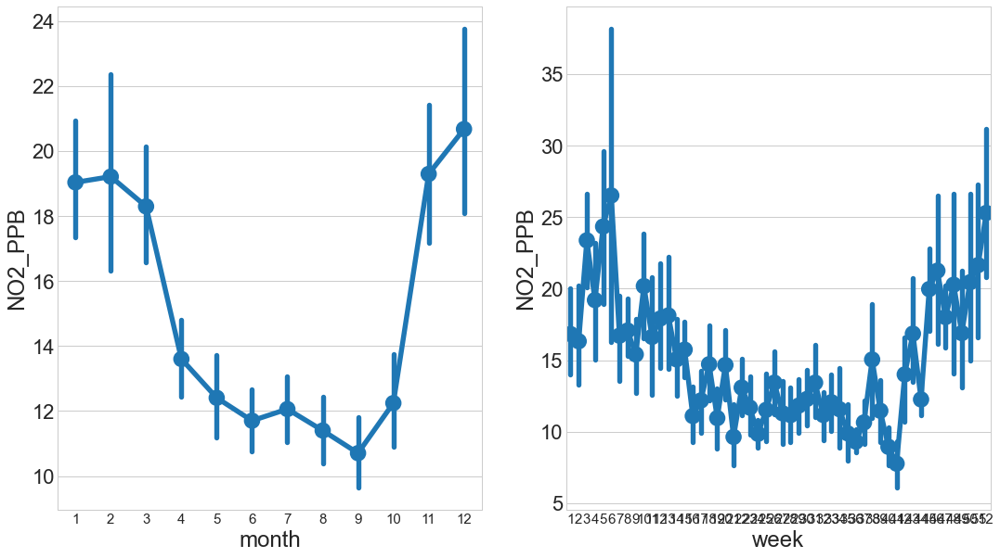

In [82]:
state_plot_no(df_2019_cp, 'New York')

C:\Users\satou\AppData\Local\Temp\ipykernel_22480\3825994908.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  State_name['month']=State_name.index.month
C:\Users\satou\AppData\Local\Temp\ipykernel_22480\3825994908.py:6: FutureWarning: weekofyear and week have been deprecated, please use DatetimeIndex.isocalendar().week instead, which returns a Series. To exactly reproduce the behavior of week and weekofyear and return an Index, you may call pd.Int64Index(idx.isocalendar().week)
  State_name['week']=State_name.index.week
C:\Users\satou\AppData\Local\Temp\ipykernel_22480\3825994908.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the cav

NO2 distribution inNew York


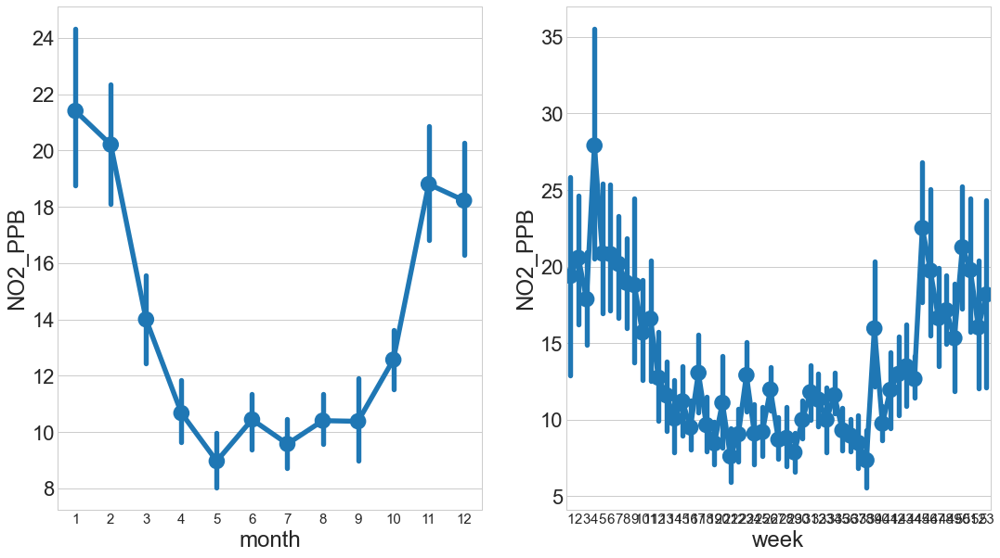

In [83]:
state_plot_no(df_2020_cp, 'New York')

In [84]:
def county_plot_pm(df, value):
    #df_2020_cp= df_2020.copy()
    #df_2020_cp.set_index('DATE',inplace=True)
    County_name = df[df['COUNTY']==value]
    County_name['month']=County_name.index.month
    County_name['week']=County_name.index.week
    print("PM25 distribution in" + value)
    fig,axes=plt.subplots(1,2,figsize=(18,10))
    sns.pointplot(x='month',y='PM25_UG_PER_CUBIC_METER',data=County_name,ax=axes[0])
    sns.pointplot(x='week',y='PM25_UG_PER_CUBIC_METER',data=County_name,ax=axes[1]);

C:\Users\satou\AppData\Local\Temp\ipykernel_22480\1900635588.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  County_name['month']=County_name.index.month
C:\Users\satou\AppData\Local\Temp\ipykernel_22480\1900635588.py:6: FutureWarning: weekofyear and week have been deprecated, please use DatetimeIndex.isocalendar().week instead, which returns a Series. To exactly reproduce the behavior of week and weekofyear and return an Index, you may call pd.Int64Index(idx.isocalendar().week)
  County_name['week']=County_name.index.week
C:\Users\satou\AppData\Local\Temp\ipykernel_22480\1900635588.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the

PM25 distribution inTulare


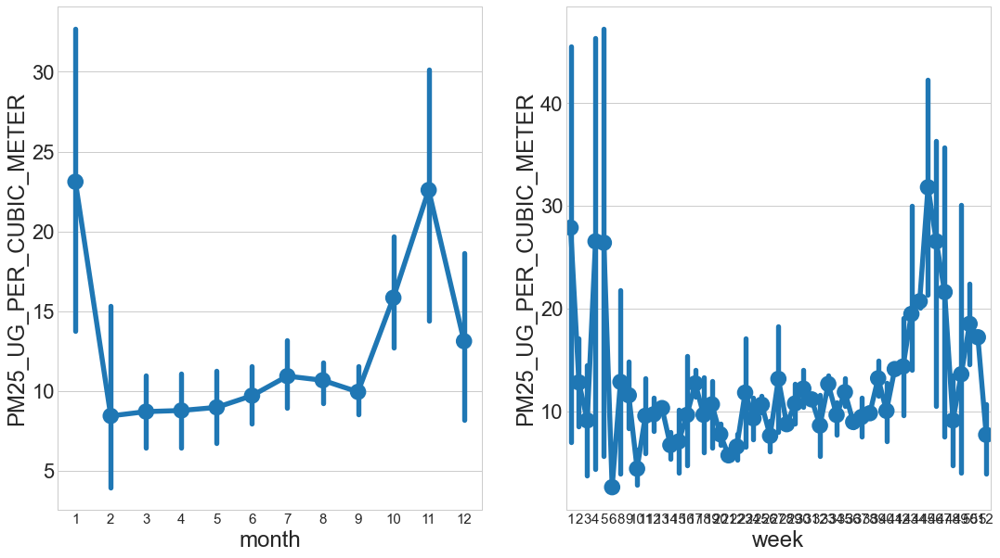

In [85]:
county_plot_pm(df_2019_cp, 'Tulare')

C:\Users\satou\AppData\Local\Temp\ipykernel_22480\1900635588.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  County_name['month']=County_name.index.month
C:\Users\satou\AppData\Local\Temp\ipykernel_22480\1900635588.py:6: FutureWarning: weekofyear and week have been deprecated, please use DatetimeIndex.isocalendar().week instead, which returns a Series. To exactly reproduce the behavior of week and weekofyear and return an Index, you may call pd.Int64Index(idx.isocalendar().week)
  County_name['week']=County_name.index.week
C:\Users\satou\AppData\Local\Temp\ipykernel_22480\1900635588.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the

PM25 distribution inTulare


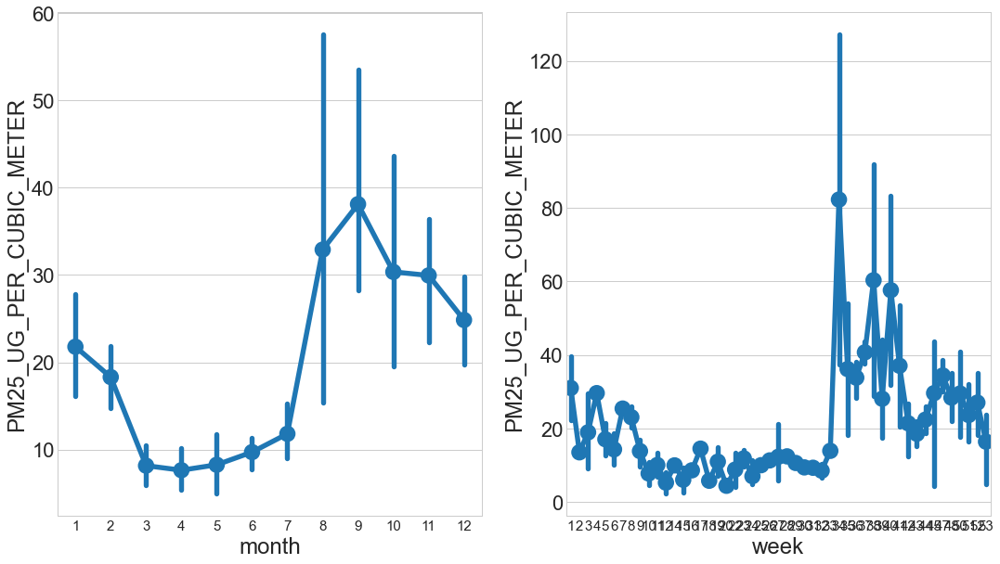

In [86]:
county_plot_pm(df_2020_cp, 'Tulare')

In [87]:
df_2020_cp.columns

Index(['AQS_ID', 'LATITUDE', 'LONGITUDE', 'COUNTY', 'STATE', 'CBSA',
       'PEOPLE_OF_COLOR_FRACTION', 'LOW_INCOME_FRACTION',
       'LINGUISTICALLY_ISOLATED_FRACTION', 'LESS_THAN_HS_ED_FRACTION',
       'TEMPERATURE_CELSIUS', 'RELATIVE_HUMIDITY',
       'WIND_SPEED_METERS_PER_SECOND', 'WIND_DIRECTION',
       'PM25_UG_PER_CUBIC_METER', 'OZONE_PPM', 'NO2_PPB', 'CO_PPM', 'SO2_PPB',
       'LEAD_UG_PER_CUBIC_METER', 'BENZENE_PPBC', 'Year_Month'],
      dtype='object')

In [88]:
'''def county_plot_ej(df, value):
    #df_2020_cp= df_2020.copy()
    #df_2020_cp.set_index('DATE',inplace=True)
    County_name = df[df['COUNTY']==value]
    County_name['month']=County_name.index.month
    County_name['week']=County_name.index.week
    print("PM25 distribution in" + value)
    fig,axes=plt.subplots(1,2,figsize=(18,10))
    sns.pointplot(x='month',y='PEOPLE_OF_COLOR_FRACTION',data=County_name,ax=axes[0])
    sns.pointplot(x='week',y='PEOPLE_OF_COLOR_FRACTION',data=County_name,ax=axes[1]);'''

'def county_plot_ej(df, value):\n    #df_2020_cp= df_2020.copy()\n    #df_2020_cp.set_index(\'DATE\',inplace=True)\n    County_name = df[df[\'COUNTY\']==value]\n    County_name[\'month\']=County_name.index.month\n    County_name[\'week\']=County_name.index.week\n    print("PM25 distribution in" + value)\n    fig,axes=plt.subplots(1,2,figsize=(18,10))\n    sns.pointplot(x=\'month\',y=\'PEOPLE_OF_COLOR_FRACTION\',data=County_name,ax=axes[0])\n    sns.pointplot(x=\'week\',y=\'PEOPLE_OF_COLOR_FRACTION\',data=County_name,ax=axes[1]);'

In [89]:
#Creating a dataframe for each of the county in the PM Matter
df_Tulare= df_2019[df_2019['COUNTY']== 'Tulare']
df_Kings= df_2019[df_2019['COUNTY']== 'Kings']
df_Marion= df_2019[df_2019['COUNTY']== 'Marion']
df_Gwinnett= df_2019[df_2019['COUNTY']== 'Gwinnett']
df_Hidalgo= df_2019[df_2019['COUNTY']== 'Hidalgo']

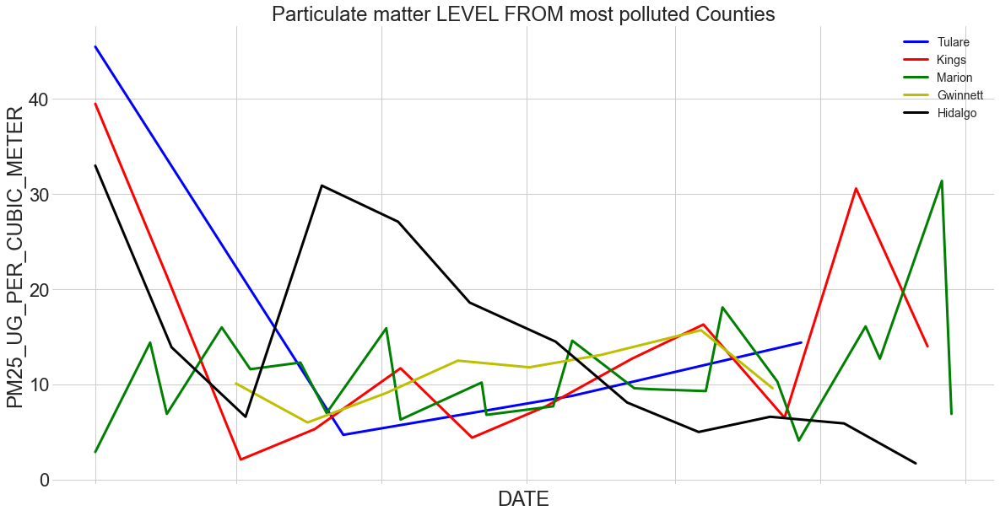

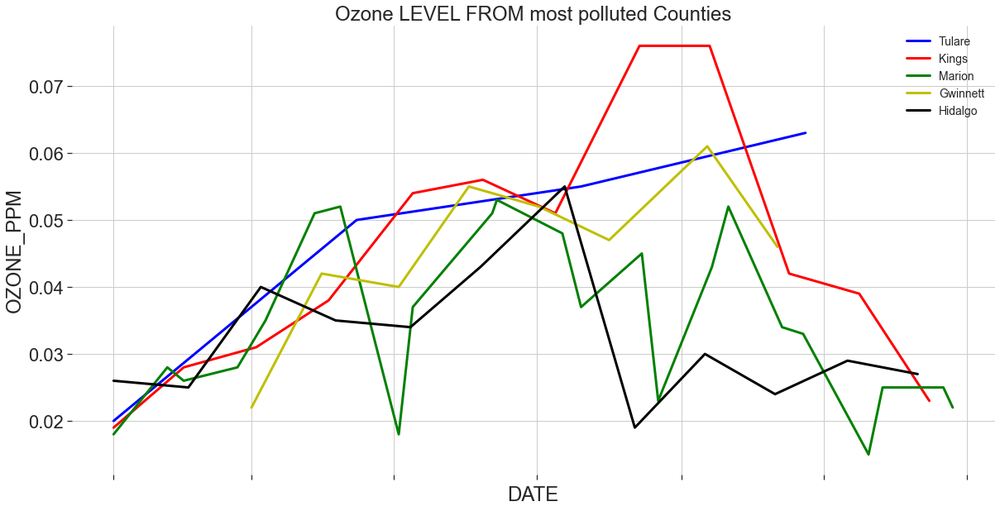

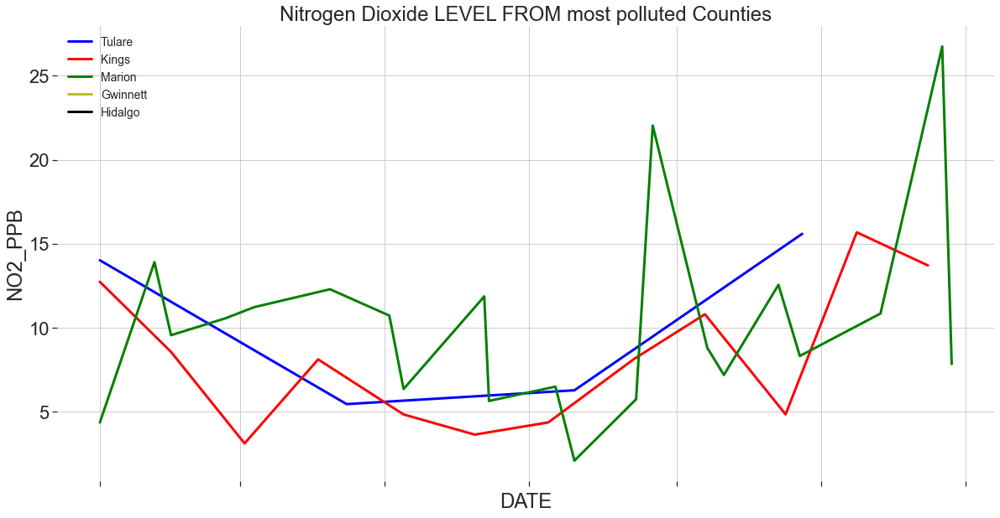

In [90]:
fig,ax = plt.subplots(figsize=(20, 10))
sns.despine(fig, left=True, bottom=True)
sns.set_context("notebook", font_scale=2, rc={"lines.linewidth": 3})

sns.lineplot(x="DATE", y="PM25_UG_PER_CUBIC_METER", data=df_Tulare.iloc[::30], color="b",label = 'Tulare')
sns.lineplot(x="DATE", y="PM25_UG_PER_CUBIC_METER", data=df_Kings.iloc  [::30], color="r",label = 'Kings')
sns.lineplot(x="DATE", y="PM25_UG_PER_CUBIC_METER", data=df_Marion.iloc[::30], color="g",label = 'Marion')
sns.lineplot(x="DATE", y="PM25_UG_PER_CUBIC_METER", data=df_Gwinnett.iloc[::30], color="y",label = 'Gwinnett')
sns.lineplot(x="DATE", y="PM25_UG_PER_CUBIC_METER", data=df_Hidalgo.iloc[::30], color="black",label = 'Hidalgo')

labels = [item.get_text() for item in ax.get_xticklabels()]
labels[1] = 'January 2019 to December 2019'
ax.set_xticklabels(ax.get_xticklabels(labels), rotation=30,ha="left")
plt.rcParams["xtick.labelsize"] = 15

ax.set_title('Particulate matter LEVEL FROM most polluted Counties')
ax.legend(fontsize = 14)

fig,ax = plt.subplots(figsize=(20, 10))
sns.despine(fig, left=True, bottom=True)
sns.set_context("notebook", font_scale=2, rc={"lines.linewidth": 3})

sns.lineplot(x="DATE", y="OZONE_PPM", data=df_Tulare.iloc[::30], color="b",label = 'Tulare')
sns.lineplot(x="DATE", y="OZONE_PPM", data=df_Kings.iloc  [::30], color="r",label = 'Kings')
sns.lineplot(x="DATE", y="OZONE_PPM", data=df_Marion.iloc[::30], color="g",label = 'Marion')
sns.lineplot(x="DATE", y="OZONE_PPM", data=df_Gwinnett.iloc[::30], color="y",label = 'Gwinnett')
sns.lineplot(x="DATE", y="OZONE_PPM", data=df_Hidalgo.iloc[::30], color="black",label = 'Hidalgo')

labels = [item.get_text() for item in ax.get_xticklabels()]
labels[1] = 'January 2019 to December 2019'
ax.set_xticklabels(ax.get_xticklabels(labels), rotation=30,ha="left")
plt.rcParams["xtick.labelsize"] = 15

ax.set_title('Ozone LEVEL FROM most polluted Counties')
ax.legend(fontsize = 14)

fig,ax = plt.subplots(figsize=(20, 10))
sns.despine(fig, left=True, bottom=True)
sns.set_context("notebook", font_scale=2, rc={"lines.linewidth": 3})

sns.lineplot(x="DATE", y="NO2_PPB", data=df_Tulare.iloc[::30], color="b",label = 'Tulare')
sns.lineplot(x="DATE", y="NO2_PPB", data=df_Kings.iloc  [::30], color="r",label = 'Kings')
sns.lineplot(x="DATE", y="NO2_PPB", data=df_Marion.iloc[::30], color="g",label = 'Marion')
sns.lineplot(x="DATE", y="NO2_PPB", data=df_Gwinnett.iloc[::30], color="y",label = 'Gwinnett')
sns.lineplot(x="DATE", y="NO2_PPB", data=df_Hidalgo.iloc[::30], color="black",label = 'Hidalgo')

labels = [item.get_text() for item in ax.get_xticklabels()]
labels[1] = 'January 2019 to December 2019'
ax.set_xticklabels(ax.get_xticklabels(labels), rotation=30,ha="left")
plt.rcParams["xtick.labelsize"] = 15

ax.set_title('Nitrogen Dioxide LEVEL FROM most polluted Counties')
ax.legend(fontsize = 14)

In [91]:
'''data=df_Tulare.iloc[::30], color ='black', label = 'Tulare')
sns.lineplot(x="DATE", y="OZONE_PPM", data=df_Kings.iloc  [::30], color="r",label = 'Kings')
sns.lineplot(x="DATE", y="OZONE_PPM", data=df_Marion.iloc[::30], color="g",label = 'Marion')
sns.lineplot(x="DATE", y="OZONE_PPM", data=df_Gwinnett.iloc[::30], color="y",label = 'Gwinnett')
sns.lineplot(x="DATE", y="OZONE_PPM", data=df_Hidalgo.iloc[::30], color="black",label = 'Hidalgo')
'''

'data=df_Tulare.iloc[::30], color =\'black\', label = \'Tulare\')\nsns.lineplot(x="DATE", y="OZONE_PPM", data=df_Kings.iloc  [::30], color="r",label = \'Kings\')\nsns.lineplot(x="DATE", y="OZONE_PPM", data=df_Marion.iloc[::30], color="g",label = \'Marion\')\nsns.lineplot(x="DATE", y="OZONE_PPM", data=df_Gwinnett.iloc[::30], color="y",label = \'Gwinnett\')\nsns.lineplot(x="DATE", y="OZONE_PPM", data=df_Hidalgo.iloc[::30], color="black",label = \'Hidalgo\')\n'

In [92]:
#df_eap.set_index('DATE',inplace=True)

df_2019 = pd.read_excel("Datathon_EPA_Air_Quality_Demographics_Meteorology_2019.xlsx")
df_2019.set_index('DATE',inplace=True)
df_2020 = pd.read_excel("Datathon_EPA_Air_Quality_Demographics_Meteorology_2020.xlsx")
df_2020.set_index('DATE',inplace=True)

df_2019.fillna(df_2019.mean(), inplace= True)
df_2019.fillna(df_2020.mean(), inplace= True)
'''df_2019_04 = df_2019.loc['2019-04-01':'2019-04-10'].groupby(['DATE']).mean().sort_values(by = 'PM25_UG_PER_CUBIC_METER', ascending = False)
df_2020_04 = df_2020.loc['2020-04-01':'2020-04-10'].groupby(['DATE']).mean().sort_values(by = 'PM25_UG_PER_CUBIC_METER', ascending = False)'''

df_2019_04 = df_2019.loc['2019-04-01':'2019-04-10']
df_2020_04 = df_2020.loc['2020-04-01':'2020-04-10']

df_2019_04['Year'] = "2019"
df_2020_04['Year'] = "2020"

df_comparison = pd.concat([df_2019_04,df_2020_04])

most_polluted_counties=['Tulare', 'Kings', 'Marion', 'Gwinnett', 'Hidalgo','San Bernardino', 'Riverside','La Plata','Duchesne', 'Kern','Denver', 'Bronx', 'Weber','Cook','Queens']
#df_comparison['5mostPollutedCounties']=df_comparison[most_polluted_counties]
#df_comparison

df_comparison_mpc= df_comparison[df_comparison['COUNTY'].isin(most_polluted_counties)]

C:\Users\satou\AppData\Local\Temp\ipykernel_22480\1352408940.py:8: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  df_2019.fillna(df_2019.mean(), inplace= True)
C:\Users\satou\AppData\Local\Temp\ipykernel_22480\1352408940.py:9: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  df_2019.fillna(df_2020.mean(), inplace= True)


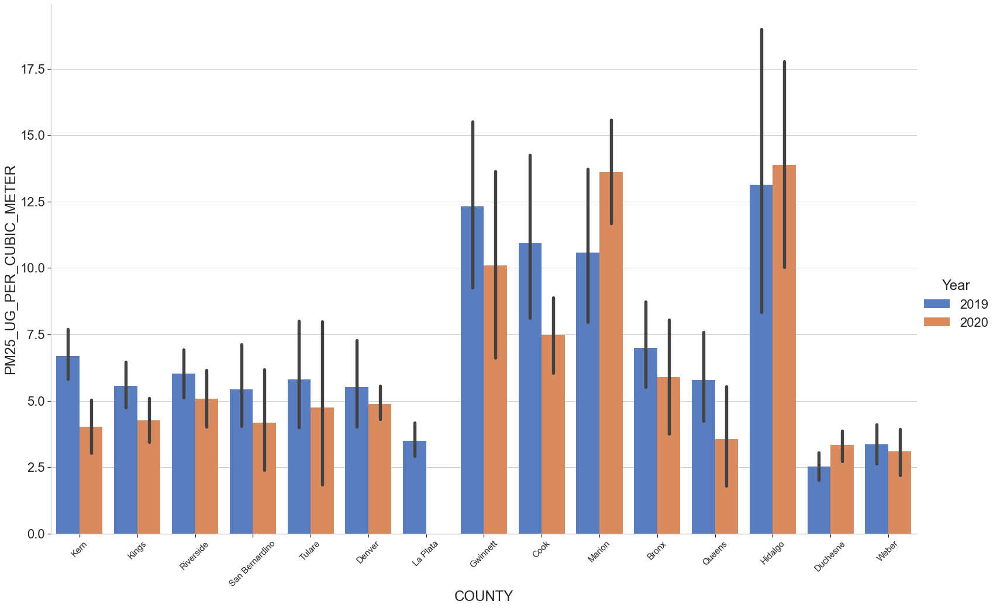

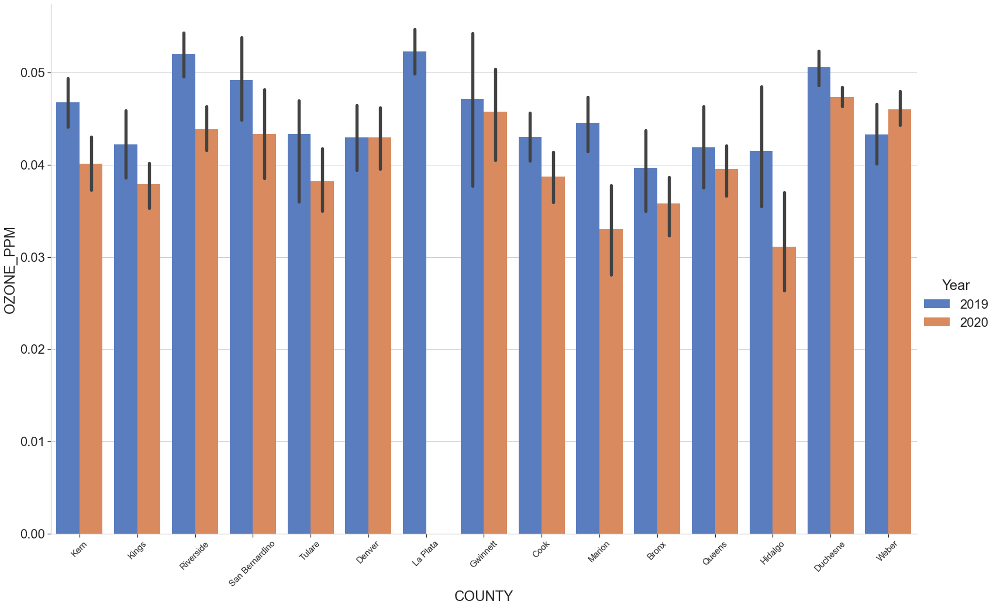

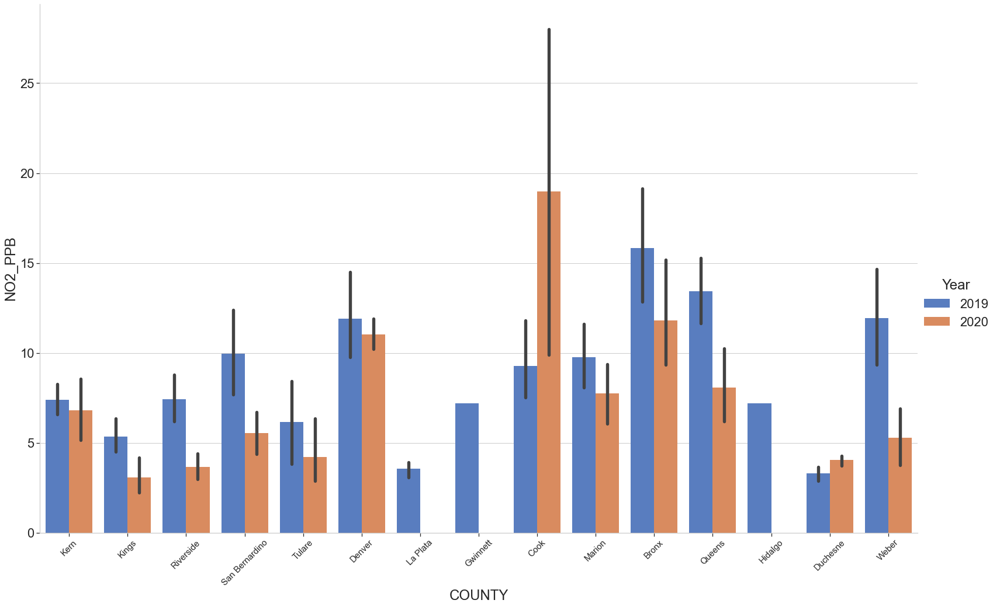

In [93]:
chart = sns.catplot(x="COUNTY", y="PM25_UG_PER_CUBIC_METER", hue="Year", data=df_comparison_mpc, height=14, aspect=1.6, kind="bar", palette="muted");
chart.set_xticklabels(rotation=45);

chart = sns.catplot(x="COUNTY", y="OZONE_PPM", hue="Year", data=df_comparison_mpc, height=14, aspect=1.6, kind="bar", palette="muted");
chart.set_xticklabels(rotation=45);

chart = sns.catplot(x="COUNTY", y="NO2_PPB", hue="Year", data=df_comparison_mpc, height=14, aspect=1.6, kind="bar", palette="muted");
chart.set_xticklabels(rotation=45);


In [94]:
#df_eap.set_index('DATE',inplace=True)

df_2019 = pd.read_excel("Datathon_EPA_Air_Quality_Demographics_Meteorology_2019.xlsx")
df_2019.set_index('DATE',inplace=True)
df_2020 = pd.read_excel("Datathon_EPA_Air_Quality_Demographics_Meteorology_2020.xlsx")
df_2020.set_index('DATE',inplace=True)

df_2019.fillna(df_2019.mean(), inplace= True)
df_2019.fillna(df_2020.mean(), inplace= True)
'''df_2019_04 = df_2019.loc['2019-04-01':'2019-04-10'].groupby(['DATE']).mean().sort_values(by = 'PM25_UG_PER_CUBIC_METER', ascending = False)
df_2020_04 = df_2020.loc['2020-04-01':'2020-04-10'].groupby(['DATE']).mean().sort_values(by = 'PM25_UG_PER_CUBIC_METER', ascending = False)'''

df_2019_04 = df_2019.loc['2019-04-01':'2019-04-10']
df_2020_04 = df_2020.loc['2020-04-01':'2020-04-10']

df_2019_04['Year'] = "2019"
df_2020_04['Year'] = "2020"

df_comparison = pd.concat([df_2019_04,df_2020_04])

most_polluted_states=['New Mexico', 'Arizona', 'Wyoming', 'Nevada', 'Colorado','Georgia', 'Alabama','Arkansas','Indiana', 'Mississippi','New York', 'Illinois', 'Nevada','District Of Columbia']
#df_comparison['5mostPollutedCounties']=df_comparison[most_polluted_counties]
#df_comparison

df_comparison_mps= df_comparison[df_comparison['STATE'].isin(most_polluted_states)]

C:\Users\satou\AppData\Local\Temp\ipykernel_22480\2847016614.py:8: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  df_2019.fillna(df_2019.mean(), inplace= True)
C:\Users\satou\AppData\Local\Temp\ipykernel_22480\2847016614.py:9: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  df_2019.fillna(df_2020.mean(), inplace= True)


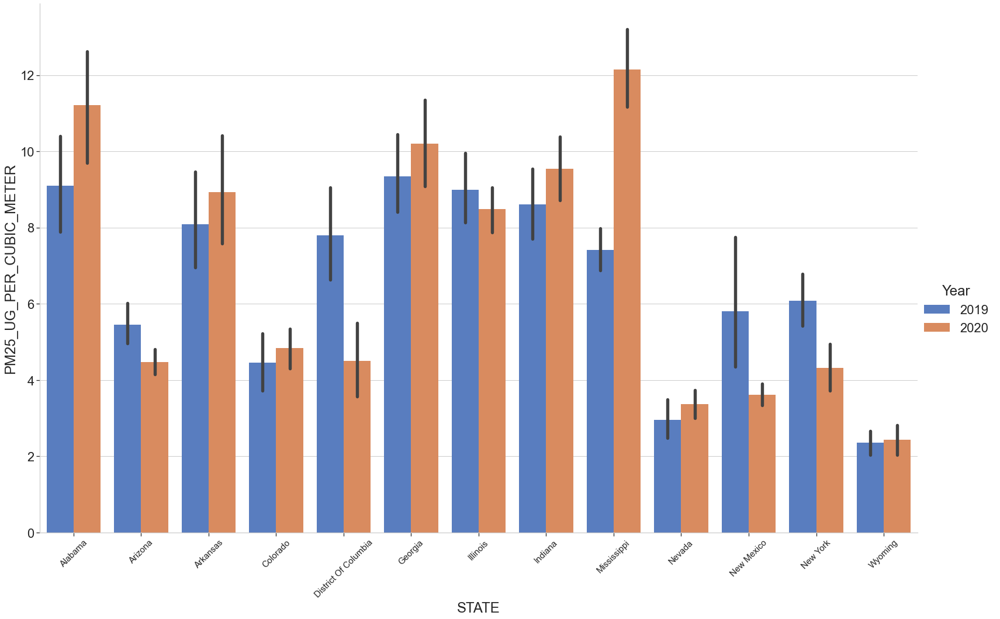

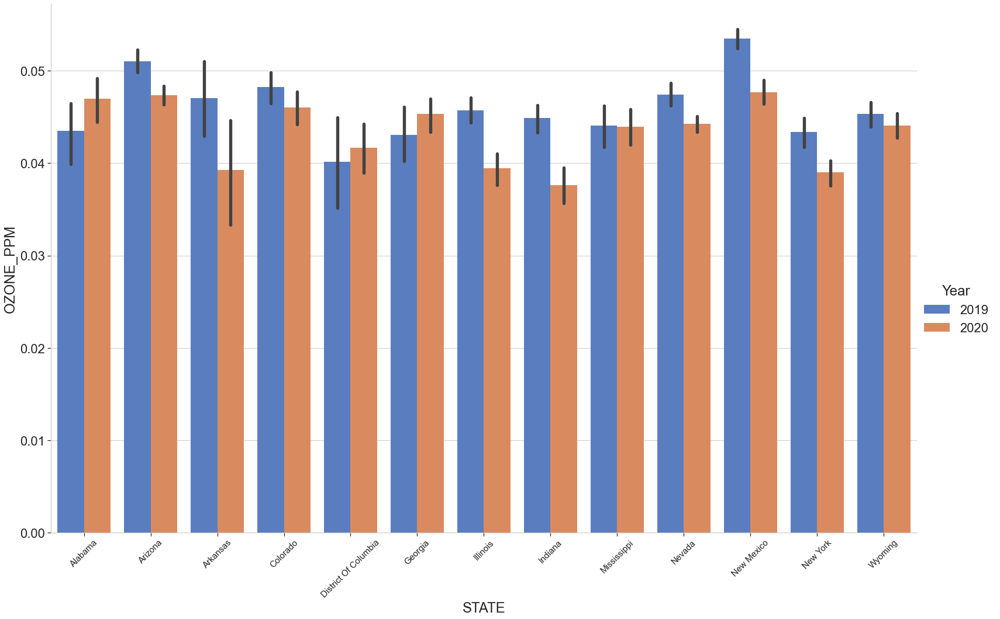

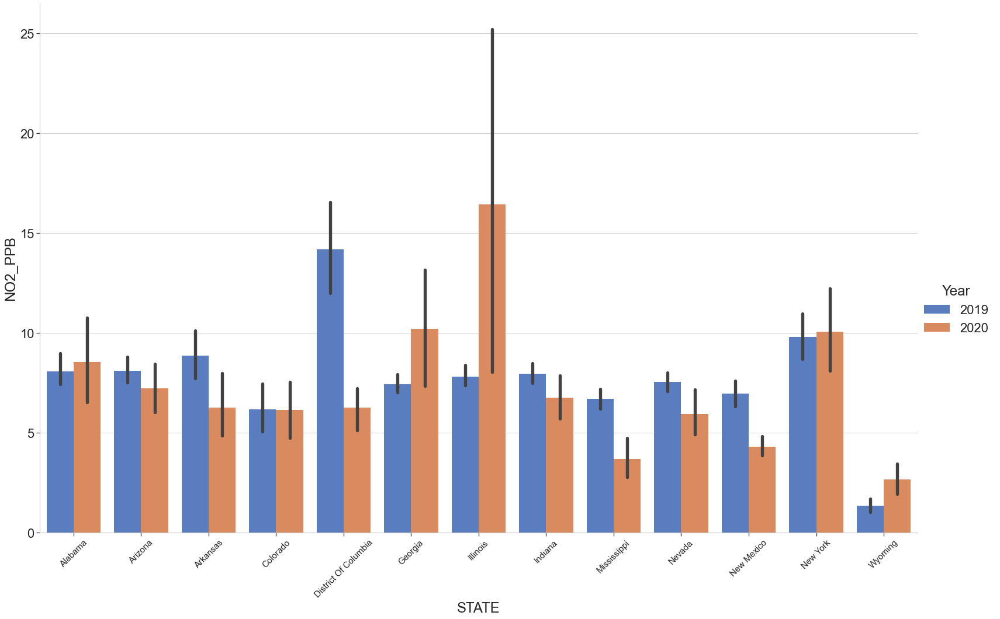

In [95]:
chart = sns.catplot(x="STATE", y="PM25_UG_PER_CUBIC_METER", hue="Year", data=df_comparison_mps, height=14, aspect=1.6, kind="bar", palette="muted");
chart.set_xticklabels(rotation=45);

chart = sns.catplot(x="STATE", y="OZONE_PPM", hue="Year", data=df_comparison_mps, height=14, aspect=1.6, kind="bar", palette="muted");
chart.set_xticklabels(rotation=45);

chart = sns.catplot(x="STATE", y="NO2_PPB", hue="Year", data=df_comparison_mps, height=14, aspect=1.6, kind="bar", palette="muted");
chart.set_xticklabels(rotation=45);


In [96]:
#PM25_UG_PER_CUBIC_METER', 'OZONE_PPM', 'NO2_PPB'

df_Tulare = df_comparison[df_comparison['COUNTY'] == "Tulare"]
df_Tulare[['PM25_UG_PER_CUBIC_METER', 'OZONE_PPM', 'NO2_PPB']].style.background_gradient(cmap='Reds')

,PM25_UG_PER_CUBIC_METER,OZONE_PPM,NO2_PPB
DATE,,,
2019-04-03 00:00:00,5.400000,0.036000,8.421739
2019-04-06 00:00:00,8.000000,0.047000,6.256522
2019-04-09 00:00:00,4.000000,0.047000,3.826087
2020-04-03 00:00:00,10.300000,0.044000,7.469565
2020-04-07 00:00:00,4.400000,0.039000,3.626087
2020-04-08 00:00:00,3.300000,0.035000,2.778261
2020-04-06 00:00:00,1.000000,0.035000,2.960870


In [97]:
#County_name['month']=County_name.index.month
#County_name['week']=County_name.index.week

pd.set_option('display.float_format', lambda x: '%.4f' % x)
df_2019 = pd.read_excel("Datathon_EPA_Air_Quality_Demographics_Meteorology_2019.xlsx")
#df_2019.set_index('DATE',inplace=True)
#df_2020 = pd.read_excel("Datathon_EPA_Air_Quality_Demographics_Meteorology_2020.xlsx")
#df_2020.set_index('DATE',inplace=True)

df_2019['month'] = df_2019['DATE'].apply(lambda x: x.month)
df_2019['week'] = df_2019['DATE'].apply(lambda x: x.week)
df_2019['year'] = df_2019['DATE'].apply(lambda x: x.year)
df_2019['day'] = df_2019['DATE'].apply(lambda x: x.day)
df_2019['weekday']=df_2019.apply(lambda row: row["DATE"].weekday(),axis=1)

C:\Users\satou\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


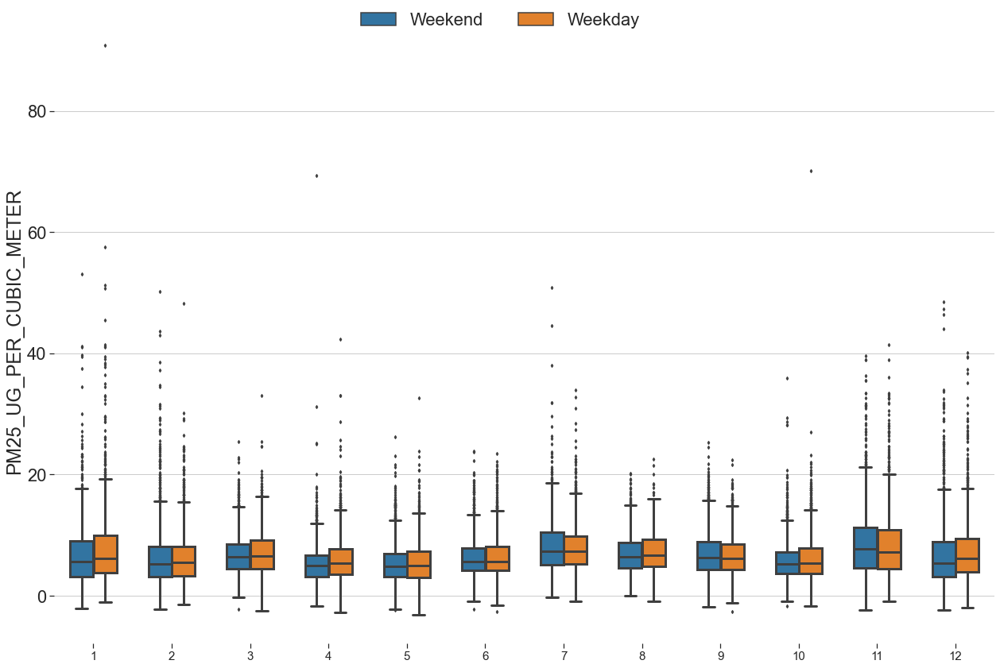

In [98]:
dic={0:'Weekend',1:'Weekday'}
df_2019['Day'] = df_2019.weekday.map(dic)
a=plt.figure(figsize=(18,12)) 
plt1=sns.boxplot('month','PM25_UG_PER_CUBIC_METER',hue='Day',width=0.6,fliersize=3,
                    data=df_2019)                                                                                                                                                                                                                                                                                                                                                 
a.legend(loc='upper center', bbox_to_anchor=(0.5, 1.00), shadow=True, ncol=2)
sns.despine(left=True, bottom=True) 
plt.xlabel('')
plt.tight_layout()                                                                                                                  
plt.legend().set_visible(False);

# Modeling

In [99]:
df_2019 = pd.read_excel("Datathon_EPA_Air_Quality_Demographics_Meteorology_2019.xlsx")
df_2020 = pd.read_excel("Datathon_EPA_Air_Quality_Demographics_Meteorology_2020.xlsx")

df_bcovid = df_2019.copy()
df_acovid = df_2020.copy()

#FillingNA

df_bcovid['PM25_UG_PER_CUBIC_METER']=df_bcovid['PM25_UG_PER_CUBIC_METER'].fillna((df_bcovid['PM25_UG_PER_CUBIC_METER'].median()))
df_bcovid['OZONE_PPM']=df_bcovid['OZONE_PPM'].fillna((df_bcovid['OZONE_PPM'].median()))
df_bcovid['NO2_PPB']=df_bcovid['NO2_PPB'].fillna((df_bcovid['NO2_PPB'].median()))

df_acovid['PM25_UG_PER_CUBIC_METER']=df_acovid['PM25_UG_PER_CUBIC_METER'].fillna((df_acovid['PM25_UG_PER_CUBIC_METER'].median()))
df_acovid['OZONE_PPM']=df_acovid['OZONE_PPM'].fillna((df_acovid['OZONE_PPM'].median()))
df_acovid['NO2_PPB']=df_acovid['NO2_PPB'].fillna((df_acovid['NO2_PPB'].median()))

In [100]:
from sklearn.preprocessing import StandardScaler, LabelEncoder

categorical_attributes = list(df_bcovid.select_dtypes(include=['object']).columns)
print("categorical_attributes",categorical_attributes)
le=LabelEncoder()
df_bcovid['STATE']=le.fit_transform(df_bcovid['STATE'].astype(str))
df_bcovid['PM25_UG_PER_CUBIC_METER']=le.fit_transform(df_bcovid['PM25_UG_PER_CUBIC_METER'].astype(str))

df_bcovid.info()

categorical_attributes ['AQS_ID', 'COUNTY', 'STATE', 'CBSA']
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 129470 entries, 0 to 129469
Data columns (total 22 columns):
 #   Column                            Non-Null Count   Dtype         
---  ------                            --------------   -----         
 0   AQS_ID                            129470 non-null  object        
 1   LATITUDE                          129470 non-null  float64       
 2   LONGITUDE                         129470 non-null  float64       
 3   COUNTY                            129470 non-null  object        
 4   STATE                             129470 non-null  int32         
 5   CBSA                              117210 non-null  object        
 6   PEOPLE_OF_COLOR_FRACTION          129393 non-null  float64       
 7   LOW_INCOME_FRACTION               129393 non-null  float64       
 8   LINGUISTICALLY_ISOLATED_FRACTION  129393 non-null  float64       
 9   LESS_THAN_HS_ED_FRACTION          129393 n

In [101]:
cor = df_bcovid.corr()
cor.style.background_gradient(cmap='coolwarm')

,LATITUDE,LONGITUDE,STATE,PEOPLE_OF_COLOR_FRACTION,LOW_INCOME_FRACTION,LINGUISTICALLY_ISOLATED_FRACTION,LESS_THAN_HS_ED_FRACTION,TEMPERATURE_CELSIUS,RELATIVE_HUMIDITY,WIND_SPEED_METERS_PER_SECOND,WIND_DIRECTION,PM25_UG_PER_CUBIC_METER,OZONE_PPM,NO2_PPB,CO_PPM,SO2_PPB,LEAD_UG_PER_CUBIC_METER,BENZENE_PPBC
LATITUDE,1.000000,0.189144,0.325862,-0.462128,-0.215728,-0.220349,-0.267396,-0.416590,0.141049,0.052020,0.110537,-0.063289,-0.094163,-0.090964,-0.074972,0.194408,-0.202764,-0.061531
LONGITUDE,0.189144,1.000000,0.357159,-0.226340,-0.106510,-0.230461,-0.152277,-0.075029,0.260830,0.014777,-0.035073,0.073081,-0.073068,-0.079982,-0.188091,-0.186386,-0.203958,-0.020450
STATE,0.325862,0.357159,1.000000,-0.319250,-0.163957,-0.216554,-0.203666,-0.160294,0.076188,0.074123,-0.063558,-0.035434,-0.029075,-0.099697,-0.275778,-0.098271,-0.093526,-0.009471
PEOPLE_OF_COLOR_FRACTION,-0.462128,-0.226340,-0.319250,1.000000,0.510822,0.552322,0.605176,0.265387,-0.094116,-0.035338,-0.024500,0.017447,0.031789,0.291341,0.220231,-0.043104,0.157704,0.160934
LOW_INCOME_FRACTION,-0.215728,-0.106510,-0.163957,0.510822,1.000000,0.338428,0.592987,0.155956,-0.137221,-0.044728,-0.004188,0.019693,0.029000,0.164164,0.109275,0.006903,0.111215,0.232972
LINGUISTICALLY_ISOLATED_FRACTION,-0.220349,-0.230461,-0.216554,0.552322,0.338428,1.000000,0.636337,0.170888,-0.106379,0.025219,0.067068,0.015385,0.040867,0.189998,0.169589,-0.034074,0.187847,0.063838
LESS_THAN_HS_ED_FRACTION,-0.267396,-0.152277,-0.203666,0.605176,0.592987,0.636337,1.000000,0.184506,-0.050500,-0.020296,0.038286,0.015885,0.032111,0.173340,0.180706,-0.006144,0.180319,0.195223
TEMPERATURE_CELSIUS,-0.416590,-0.075029,-0.160294,0.265387,0.155956,0.170888,0.184506,1.000000,-0.245338,-0.057685,-0.045597,0.136781,0.401834,-0.041091,-0.098502,-0.126212,0.176116,-0.104959
RELATIVE_HUMIDITY,0.141049,0.260830,0.076188,-0.094116,-0.137221,-0.106379,-0.050500,-0.245338,1.000000,-0.030303,-0.147767,-0.061840,-0.460817,-0.104434,-0.065741,-0.133056,-0.319531,-0.079040
WIND_SPEED_METERS_PER_SECOND,0.052020,0.014777,0.074123,-0.035338,-0.044728,0.025219,-0.020296,-0.057685,-0.030303,1.000000,0.046818,-0.015217,-0.012067,-0.060105,-0.050045,0.003894,-0.046302,-0.097525


In [102]:
from sklearn.model_selection import train_test_split

y = df_bcovid["PM25_UG_PER_CUBIC_METER"]
x = df_bcovid[['STATE', 'PEOPLE_OF_COLOR_FRACTION', 'LOW_INCOME_FRACTION', 'LINGUISTICALLY_ISOLATED_FRACTION', 'LESS_THAN_HS_ED_FRACTION', 'OZONE_PPM', 'NO2_PPB']]
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size = 0.3, random_state = 0)

In [103]:
from collections import Counter
print('Classes and number of values in trainset',Counter(y_train))

Classes and number of values in trainset Counter({421: 1261, 372: 1211, 423: 1207, 369: 1182, 428: 1161, 449: 1160, 426: 1159, 367: 1152, 374: 1145, 270: 1090, 451: 1083, 272: 1081, 373: 1081, 370: 1054, 422: 1053, 375: 1041, 425: 1029, 454: 1028, 376: 1026, 430: 1023, 424: 1013, 450: 1008, 371: 1005, 368: 996, 429: 987, 456: 984, 427: 981, 467: 954, 274: 945, 271: 934, 453: 932, 267: 932, 265: 930, 452: 923, 455: 905, 273: 905, 469: 898, 269: 871, 474: 861, 472: 859, 162: 851, 457: 849, 458: 833, 160: 830, 480: 814, 266: 811, 468: 811, 268: 803, 471: 780, 470: 759, 475: 728, 482: 726, 485: 723, 164: 721, 473: 709, 163: 709, 476: 702, 161: 693, 487: 691, 481: 674, 155: 660, 491: 659, 483: 656, 493: 636, 157: 619, 488: 610, 158: 606, 486: 601, 159: 594, 484: 582, 496: 555, 55: 549, 156: 535, 52: 533, 492: 512, 489: 511, 494: 506, 498: 504, 495: 501, 54: 486, 497: 478, 53: 478, 57: 478, 60: 475, 499: 446, 50: 435, 500: 434, 59: 419, 56: 414, 58: 407, 62: 405, 61: 393, 45: 383, 49: 375, 5

In [104]:
#!pip install imblearn

In [1]:
'''from imblearn.over_sampling import SMOTE
import sklearn.metrics
oversample = SMOTE()
X_train,y_train = oversample.fit_resample(X_train,y_train)
print('Classes and number of values in trainset after SMOTE:',Counter(y_train))'''

"from imblearn.over_sampling import SMOTE\nimport sklearn.metrics\noversample = SMOTE()\nX_train,y_train = oversample.fit_resample(X_train,y_train)\nprint('Classes and number of values in trainset after SMOTE:',Counter(y_train))"